<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 15px; height: 80px">

# Project 3

### Regression and Classification with the Ames Housing Data

---

You have just joined a new "full stack" real estate company in Ames, Iowa. The strategy of the firm is two-fold:
- Own the entire process from the purchase of the land all the way to sale of the house, and anything in between.
- Use statistical analysis to optimize investment and maximize return.

The company is still small, and though investment is substantial the short-term goals of the company are more oriented towards purchasing existing houses and flipping them as opposed to constructing entirely new houses. That being said, the company has access to a large construction workforce operating at rock-bottom prices.

This project uses the [Ames housing data recently made available on kaggle](https://www.kaggle.com/c/house-prices-advanced-regression-techniques).

In [1]:
import numpy as np
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

plt.style.use('ggplot')

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns', None)

<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 1. Estimating the value of homes from fixed characteristics.

---

Your superiors have outlined this year's strategy for the company:
1. Develop an algorithm to reliably estimate the value of residential houses based on *fixed* characteristics.
2. Identify characteristics of houses that the company can cost-effectively change/renovate with their construction team.
3. Evaluate the mean dollar value of different renovations.

Then we can use that to buy houses that are likely to sell for more than the cost of the purchase plus renovations.

Your first job is to tackle #1. You have a dataset of housing sale data with a huge amount of features identifying different aspects of the house. The full description of the data features can be found in a separate file:

    housing.csv
    data_description.txt
    
You need to build a reliable estimator for the price of the house given characteristics of the house that cannot be renovated. Some examples include:
- The neighborhood
- Square feet
- Bedrooms, bathrooms
- Basement and garage space

and many more. 

Some examples of things that **ARE renovateable:**
- Roof and exterior features
- "Quality" metrics, such as kitchen quality
- "Condition" metrics, such as condition of garage
- Heating and electrical components

and generally anything you deem can be modified without having to undergo major construction on the house.

---

**Your goals:**
1. Perform any cleaning, feature engineering, and EDA you deem necessary.
- Be sure to remove any houses that are not residential from the dataset.
- Identify **fixed** features that can predict price.
- Train a model on pre-2010 data and evaluate its performance on the 2010 houses.
- Characterize your model. How well does it perform? What are the best estimates of price?

> **Note:** The EDA and feature engineering component to this project is not trivial! Be sure to always think critically and creatively. Justify your actions! Use the data description file!

## Loading the data

In [4]:
# Load the data
house = pd.read_csv('./housing.csv')

## Initial overview of the DataFrame

In [5]:
house.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [6]:
house.tail()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,GasA,Gd,Y,FuseA,1078,0,0,1078,1,0,1,0,2,1,Gd,5,Typ,0,NaN,Attchd,1950.0,Unf,1,240,TA,TA,Y,366,0,112,0,0,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125
1459,1460,20,RL,75.0,9937,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,5,6,1965,1965,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,TA,TA,No,BLQ,830,LwQ,290,136,1256,GasA,Gd,Y,SBrkr,1256,0,0,1256,1,0,1,1,3,1,TA,6,Typ,0,NaN,Attchd,1965.0,Fin,1,276,TA,TA,Y,736,68,0,0,0,0,NaN,NaN,NaN,0,6,2008,WD,Normal,147500


In [7]:
house.shape

(1460, 81)

In [8]:
house.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [9]:
house.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [10]:
house.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [11]:
house.describe(include='all')

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
count,1460.000000,1460.000000,1460,1201.000000,1460.000000,1460,91,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460.000000,1460.000000,1460.000000,1460.000000,1460,1460,1460,1460,1452,1452.000000,1460,1460,1460,1423,1423,1422,1423,1460.000000,1422,1460.000000,1460.000000,1460.000000,1460,1460,1460,1459,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460,1460.000000,1460,1460.000000,770,1379,1379.000000,1379,1460.000000,1460.000000,1379,1379,1460,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,7,281,54,1460.000000,1460.000000,1460.000000,1460,1460,1460.000000
unique,NaN,NaN,5,NaN,NaN,2,2,4,4,2,5,3,25,9,8,5,8,NaN,NaN,NaN,NaN,6,8,15,16,4,NaN,4,5,6,4,4,4,6,NaN,6,NaN,NaN,NaN,6,5,2,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,NaN,7,NaN,5,6,NaN,3,NaN,NaN,5,5,3,NaN,NaN,NaN,NaN,NaN,NaN,3,4,4,NaN,NaN,NaN,9,6,NaN
top,NaN,NaN,RL,NaN,NaN,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,NaN,NaN,NaN,NaN,Gable,CompShg,VinylSd,VinylSd,None,NaN,TA,TA,PConc,TA,TA,No,Unf,NaN,Unf,NaN,NaN,NaN,GasA,Ex,Y,SBrkr,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,TA,NaN,Typ,NaN,Gd,Attchd,NaN,Unf,NaN,NaN,TA,TA,Y,NaN,NaN,NaN,NaN,NaN,NaN,Gd,MnPrv,Shed,NaN,NaN,NaN,WD,Normal,NaN
freq,NaN,NaN,1151,NaN,NaN,1454,50,925,1311,1459,1052,1382,225,1260,1445,1220,726,NaN,NaN,NaN,NaN,1141,1434,515,504,864,NaN,906,1282,647,649,1311,953,430,NaN,1256,NaN,NaN,NaN,1428,741,1365,1334,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,735,NaN,1360,NaN,380,870,NaN,605,NaN,NaN,1311,1326,1340,NaN,NaN,NaN,NaN,NaN,NaN,3,157,49,NaN,NaN,NaN,1267,1198,NaN
mean,730.500000,56.897260,NaN,70.049958,10516.828082,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.099315,5.575342,1971.267808,1984.865753,NaN,NaN,NaN,NaN,NaN,103.685262,NaN,NaN,NaN,NaN,NaN,NaN,NaN,443.639726,NaN,46.549315,567.240411,1057.429452,NaN,NaN,NaN,NaN,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,NaN,6.517808,NaN,0.613014,NaN,NaN,1978.506164,NaN,1.767123,472.980137,NaN,NaN,NaN,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,NaN,NaN,NaN,43.489041,6.321918,2007.815753,NaN,NaN,180921.195890
std,421.610009,42.300571,NaN,24.284752,9981.264932,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.382997,1.112799,30.202904,20.645407,NaN,NaN,NaN,NaN,NaN,181.066207,NaN,NaN,NaN,NaN,NaN,NaN,NaN,456.098091,NaN,161.319273,441.866955,438.705324,NaN,NaN,NaN,NaN,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,NaN,1.625393,NaN,0.644666,NaN,NaN,24.689725,NaN,0.747315,213.804841,NaN,NaN,NaN,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,NaN,NaN,NaN,496.123024,2.703626,1.328095,NaN,NaN,79442.502883
min,1.000000,20.000000,NaN,21.000000,1300.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,1.000000,1872.000000,1950.000000,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,2.000000,NaN,0.000000,NaN,NaN,1900.000000,NaN

### Renaming the columns

In [12]:
#MAKING THE COLUMNS NAME MORE MEANINGFUL 
new_columns_dict = {'Id': 'id', 
                    'MSSubClass': 'property_subclass',
                    'MSZoning':'property_zoning', 
                    'LotFrontage': 'lot_frontage', 
                    'LotArea':'lot_area',
                    'Street':'street',
                    'Alley':'alley', 
                    'LotShape':'lot_shape', 
                    'LandContour':'land_contour', 
                    'Utilities':'utilities', 
                    'LotConfig':'lot_config',
                    'LandSlope': 'land_slope', 
                    'Neighborhood': 'neighbourhood', 
                    'Condition1' :'condition_1',
                    'Condition2':'condition_2', 
                    'BldgType': 'property_type',
                    'HouseStyle': 'house_style', 
                    'OverallQual': 'overall_quality',
                    'OverallCond': 'overall_condition',
                    'YearBuilt':'year_built',
                    'YearRemodAdd': 'year_remodernisation_added',
                    'RoofStyle': 'roof_style', 
                    'RoofMatl': 'roof_matl',
                    'Exterior1st':'exterior_material_1',
                    'Exterior2nd': 'exterior_material_2',
                    'MasVnrType': 'masonry_veneer_type',
                    'MasVnrArea': 'masonry_veneer_area',
                    'ExterQual': 'external_material_quality',
                    'ExterCond': 'external_material_condition',
                    'Foundation':'foundation',
                    'BsmtQual': 'basement_height_quality',
                    'BsmtCond': 'basement_condition' , 
                    'BsmtExposure': 'basement_exposure',
                    'BsmtFinType1': 'basement_finished_area_quality_type1',
                    'BsmtFinSF1': 'basement_type1_sqf',
                    'BsmtFinType2':'basement_finished_area_quality_type2',
                    'BsmtFinSF2': 'basement_type2_sqf', 
                    'BsmtUnfSF': 'basement_unfinished_sqf' ,
                    'TotalBsmtSF': 'total_basement_area_sqft', 
                    'Heating': 'heating',
                    'HeatingQC': 'heating_quality',
                    'CentralAir':'air_conditioning', 
                    'Electrical': 'electrical',
                    '1stFlrSF': 'First_floor_sqft',
                    '2ndFlrSF': 'Second_floor_sqft',
                    'LowQualFinSF':'low_quality_finish_total_area_sqft',
                    'GrLivArea': 'ground_living_space_sqft',
                    'BsmtFullBath': 'basement_full_bathrooms',
                    'BsmtHalfBath':'basement_half_bath',
                    'FullBath':'full_bathroom_above_grade',
                    'HalfBath': 'half_bathroom_above_grade', 
                    'BedroomAbvGr': 'bedrooms_above_grade', 
                    'KitchenAbvGr':'kitchen_above_grade', 
                    'KitchenQual': 'kitchen_quality',
                    'TotRmsAbvGrd':'total_rooms_above_grade',
                    'Functional': 'home_funcionality', 
                    'Fireplaces':'fireplaces',
                    'FireplaceQu':'fireplace_quality',
                    'GarageType' :'garage_type',
                    'GarageYrBlt':'garage_year_built',
                    'GarageFinish': 'garage_interior_finish',
                    'GarageCars': 'garage_cars_capacity',
                    'GarageArea':'garage_sqft_area',
                    'GarageQual': 'garage_quality',
                    'GarageCond': 'garage_condition',
                    'PavedDrive': 'paved_driveway',
                    'WoodDeckSF': 'wood_deck_area_sqft',
                    'OpenPorchSF': 'open_porch_area_sqft',
                    'EnclosedPorch': 'enclosed_porch_area_sqft',
                    '3SsnPorch':'Three_seasons_porch_area_sqft',
                    'ScreenPorch': 'screen_porch_area_sqft',
                    'PoolArea': 'pool_area_sqft',
                    'PoolQC': 'pool_quality',
                    'Fence': 'fence',
                    'MiscFeature': 'miscelanuous_features', 
                    'MiscVal': 'miscelanuous_features_value',
                    'MoSold': 'month_sold',
                    'YrSold': 'year_sold',
                    'SaleType': 'sale_type',
                    'SaleCondition': 'sale_condition',
                    'SalePrice':'sale_price'}
    
    
    
    
    
    
    

house.rename(columns=new_columns_dict, inplace=True)

In [13]:
house.head(2)

,id,property_subclass,property_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighbourhood,condition_1,condition_2,property_type,house_style,overall_quality,overall_condition,year_built,year_remodernisation_added,roof_style,roof_matl,exterior_material_1,exterior_material_2,masonry_veneer_type,masonry_veneer_area,external_material_quality,external_material_condition,foundation,basement_height_quality,basement_condition,basement_exposure,basement_finished_area_quality_type1,basement_type1_sqf,basement_finished_area_quality_type2,basement_type2_sqf,basement_unfinished_sqf,total_basement_area_sqft,heating,heating_quality,air_conditioning,electrical,First_floor_sqft,Second_floor_sqft,low_quality_finish_total_area_sqft,ground_living_space_sqft,basement_full_bathrooms,basement_half_bath,full_bathroom_above_grade,half_bathroom_above_grade,bedrooms_above_grade,kitchen_above_grade,kitchen_quality,total_rooms_above_grade,home_funcionality,fireplaces,fireplace_quality,garage_type,garage_year_built,garage_interior_finish,garage_cars_capacity,garage_sqft_area,garage_quality,garage_condition,paved_driveway,wood_deck_area_sqft,open_porch_area_sqft,enclosed_porch_area_sqft,Three_seasons_porch_area_sqft,screen_porch_area_sqft,pool_area_sqft,pool_quality,fence,miscelanuous_features,miscelanuous_features_value,month_sold,year_sold,sale_type,sale_condition,sale_price
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500


### Filtering data frame - focusing on the residential properties only

In [14]:
house.property_zoning.value_counts()

RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: property_zoning, dtype: int64

In [15]:
#dropping properties that are not classed as residential
house.drop(house[house['property_zoning']=='C (all)'].index,inplace=True)

In [16]:
house.property_zoning.unique()

array(['RL', 'RM', 'FV', 'RH'], dtype=object)

## Inspecting Missing Values


In [17]:
total_cells = np.product(house.shape)
total_cells

117450

In [18]:
house.isnull().sum().sum()

6913

In [19]:
#looking at nan values
house.isna().sum()

id                                         0
property_subclass                          0
property_zoning                            0
lot_frontage                             259
lot_area                                   0
street                                     0
alley                                   1361
lot_shape                                  0
land_contour                               0
utilities                                  0
lot_config                                 0
land_slope                                 0
neighbourhood                              0
condition_1                                0
condition_2                                0
property_type                              0
house_style                                0
overall_quality                            0
overall_condition                          0
year_built                                 0
year_remodernisation_added                 0
roof_style                                 0
roof_matl 

In [20]:
total_cells = np.product(house.shape)
missing_values_count = house.isnull().sum()
total_missing = missing_values_count.sum()

# percent of data that is missing
(total_missing/total_cells) * 100

5.885908897403151

In [21]:
#creating copy of house df - in case we need it later
house_copy = house.copy()
house_copy.head(2)

,id,property_subclass,property_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighbourhood,condition_1,condition_2,property_type,house_style,overall_quality,overall_condition,year_built,year_remodernisation_added,roof_style,roof_matl,exterior_material_1,exterior_material_2,masonry_veneer_type,masonry_veneer_area,external_material_quality,external_material_condition,foundation,basement_height_quality,basement_condition,basement_exposure,basement_finished_area_quality_type1,basement_type1_sqf,basement_finished_area_quality_type2,basement_type2_sqf,basement_unfinished_sqf,total_basement_area_sqft,heating,heating_quality,air_conditioning,electrical,First_floor_sqft,Second_floor_sqft,low_quality_finish_total_area_sqft,ground_living_space_sqft,basement_full_bathrooms,basement_half_bath,full_bathroom_above_grade,half_bathroom_above_grade,bedrooms_above_grade,kitchen_above_grade,kitchen_quality,total_rooms_above_grade,home_funcionality,fireplaces,fireplace_quality,garage_type,garage_year_built,garage_interior_finish,garage_cars_capacity,garage_sqft_area,garage_quality,garage_condition,paved_driveway,wood_deck_area_sqft,open_porch_area_sqft,enclosed_porch_area_sqft,Three_seasons_porch_area_sqft,screen_porch_area_sqft,pool_area_sqft,pool_quality,fence,miscelanuous_features,miscelanuous_features_value,month_sold,year_sold,sale_type,sale_condition,sale_price
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500


In [22]:
#looking into correlation - to identyfy any strong correlation and decide if columns with nan's 
#can be dropped or has to be filled
house.corr().sort_values(by = 'sale_price', ascending=False)

,id,property_subclass,lot_frontage,lot_area,overall_quality,overall_condition,year_built,year_remodernisation_added,masonry_veneer_area,basement_type1_sqf,basement_type2_sqf,basement_unfinished_sqf,total_basement_area_sqft,First_floor_sqft,Second_floor_sqft,low_quality_finish_total_area_sqft,ground_living_space_sqft,basement_full_bathrooms,basement_half_bath,full_bathroom_above_grade,half_bathroom_above_grade,bedrooms_above_grade,kitchen_above_grade,total_rooms_above_grade,fireplaces,garage_year_built,garage_cars_capacity,garage_sqft_area,wood_deck_area_sqft,open_porch_area_sqft,enclosed_porch_area_sqft,Three_seasons_porch_area_sqft,screen_porch_area_sqft,pool_area_sqft,miscelanuous_features_value,month_sold,year_sold,sale_price
sale_price,-0.024353,-0.087487,0.354848,0.264715,0.789031,-0.089084,0.517602,0.501186,0.475950,0.384475,-0.014145,0.216152,0.612088,0.603300,0.319774,-0.018755,0.708658,0.224054,-0.017561,0.556674,0.280882,0.162008,-0.137825,0.533355,0.463264,0.486058,0.642135,0.629831,0.320770,0.329491,-0.120765,0.043807,0.110540,0.092396,-0.021052,0.051987,-0.025391,1.000000
overall_quality,-0.030440,0.028891,0.257274,0.106457,1.000000,-0.107874,0.567392,0.544850,0.410450,0.235139,-0.062980,0.313101,0.536622,0.472004,0.295153,-0.016250,0.591722,0.107451,-0.043259,0.544777,0.270713,0.091649,-0.189207,0.426924,0.391760,0.552363,0.602533,0.570620,0.234394,0.320894,-0.104417,0.029411,0.062759,0.065112,-0.030910,0.078088,-0.024962,0.789031
ground_living_space_sqft,0.010786,0.069245,0.405956,0.264359,0.591722,-0.086680,0.196822,0.281259,0.390445,0.204742,-0.010915,0.242100,0.452676,0.564098,0.687450,0.139930,1.000000,0.034180,-0.024402,0.627593,0.415644,0.517810,0.095599,0.825183,0.459269,0.234794,0.468693,0.474343,0.246000,0.343960,0.012947,0.020231,0.099070,0.170607,-0.001811,0.052036,-0.034738,0.708658
garage_cars_capacity,0.011243,-0.042209,0.286360,0.154124,0.602533,-0.194190,0.538183,0.421333,0.364458,0.224263,-0.039772,0.215084,0.435102,0.438864,0.183655,-0.081466,0.468693,0.130862,-0.023086,0.469312,0.219192,0.082796,-0.053186,0.362335,0.299128,0.591933,1.000000,0.883009,0.225232,0.229876,-0.143898,0.035490,0.049316,0.020769,-0.045057,0.045664,-0.038034,0.642135
garage_sqft_area,0.011743,-0.100045,0.344442,0.179251,0.570620,-0.158068,0.484036,0.377573,0.375955,0.300094,-0.018797,0.184350,0.490651,0.493368,0.139311,-0.054279,0.474343,0.181082,-0.025674,0.409003,0.163661,0.064224,-0.066208,0.338868,0.270780,0.567330,0.883009,1.000000,0.226058,0.259157,-0.116080,0.035231,0.051344,0.061484,-0.030613,0.031575,-0.025474,0.629831
total_basement_area_sqft,-0.015394,-0.242933,0.392776,0.261034,0.536622,-0.177514,0.390050,0.285987,0.362591,0.521739,0.103774,0.416454,1.000000,0.819138,-0.177026,-0.034409,0.452676,0.306864,-0.002433,0.319626,-0.051165,0.045873,-0.071585,0.283153,0.336607,0.323156,0.435102,0.490651,0.229838,0.254745,-0.091742,0.036945,0.083114,0.126034,-0.018544,0.014918,-0.013616,0.612088
First_floor_sqft,0.010273,-0.256336,0.459003,0.299984,0.472004,-0.152497,0.277341,0.233655,0.342826,0.444455,0.095856,0.319555,0.819138,1.000000,-0.205486,-0.012589,0.564098,0.243866,-0.000091,0.375875,-0.123894,0.122289,0.066817,0.408085,0.407514,0.232895,0.438864,0.493368,0.232925,0.220095,-0.059188,0.055643,0.087331,0.131577,-0.021095,0.033951,-0.012165,0.603300
full_bathroom_above_grade,0.005969,0.127755,0.200162,0.126324,0.544777,-0.206639,0.465918,0.432980,0.274707,0.052862,-0.078975,0.291557,0.319626,0.375875,0.420876,0.006178,0.627593,-0.067116,-0.059163,1.000000,0.133494,0.357586,0.130813,0.553447,0.238209,0.488572,0.469312,0.409003,0.184328,0.268524,-0.109600,0.034737,-0.011047,0.049410,-0.014123,0.059694,-0.018219,0.556674
total_rooms_above_grade,0.028958,0.034751,0.354290,0.190489,0.426924,-0.064277,0.095055,0.187457,0.280470,0.040615,-0.036119,0.252321,0.283153,0.408085,0.615526,0.138947,0.825183,-0.053697,-0.029107,0.553447,0.343000,0.675582,0.253289,1.000000,0.324072,0.150469,0.362335,0.338868,0.164801,0.246356

In [23]:
#looking at the unique values to explore the features, identify the missing values, and make assumptions on nans

In [24]:
house.electrical.unique()

array(['SBrkr', 'FuseF', 'FuseA', 'FuseP', 'Mix', nan], dtype=object)

In [25]:
house.alley.unique()

array([nan, 'Grvl', 'Pave'], dtype=object)

In [26]:
house.pool_quality.unique()

array([nan, 'Ex', 'Fa', 'Gd'], dtype=object)

In [27]:
house.fence.unique()

array([nan, 'MnPrv', 'GdWo', 'GdPrv', 'MnWw'], dtype=object)

In [28]:
house.miscelanuous_features.unique()

array([nan, 'Shed', 'Gar2', 'Othr', 'TenC'], dtype=object)

In [29]:
house.fireplaces.unique()

array([0, 1, 2, 3])

In [30]:
house.fireplace_quality.unique()

array([nan, 'TA', 'Gd', 'Fa', 'Ex', 'Po'], dtype=object)

In [31]:
house.lot_frontage.unique()

array([ 65.,  80.,  68.,  60.,  84.,  85.,  75.,  nan,  51.,  50.,  70.,
        91.,  72.,  66., 101.,  57.,  44., 110.,  98.,  47., 108., 112.,
        74., 115.,  61.,  48.,  33.,  52., 100.,  24.,  89.,  63.,  76.,
        81.,  95.,  69.,  21.,  32.,  78., 121., 122.,  40.,  73.,  77.,
        64.,  94., 105.,  34.,  90.,  55.,  88.,  82.,  71., 120., 107.,
        92., 134.,  62.,  86., 141.,  97.,  54.,  41.,  79., 174.,  99.,
        67.,  83.,  43., 103.,  93.,  30., 129., 140.,  35.,  37., 118.,
        87., 116., 150., 111.,  49.,  96.,  59.,  36.,  56., 102.,  58.,
        38., 109., 130.,  53., 137.,  45., 106., 104.,  42.,  39., 144.,
       114., 128., 149., 313., 168., 182., 138., 160., 152., 124., 153.,
        46.])

In [32]:
house.garage_condition.unique()

array(['TA', nan, 'Gd', 'Fa', 'Po', 'Ex'], dtype=object)

In [33]:
house.garage_type.unique()

array(['Attchd', 'Detchd', 'BuiltIn', 'CarPort', nan, 'Basment', '2Types'],
      dtype=object)

In [34]:
house.garage_year_built.unique()

array([2003., 1976., 2001., 1998., 2000., 1993., 2004., 1973., 1931.,
       1939., 1965., 2005., 1962., 2006., 1960., 1991., 1970., 1967.,
       1958., 1930., 2002., 1968., 2007., 2008., 1957., 1920., 1966.,
       1959., 1995., 1954., 1953.,   nan, 1983., 1977., 1997., 1985.,
       1963., 1981., 1964., 1999., 1935., 1990., 1945., 1987., 1989.,
       1915., 1956., 1948., 1974., 2009., 1950., 1961., 1921., 1979.,
       1951., 1969., 1936., 1975., 1971., 1923., 1984., 1926., 1955.,
       1986., 1988., 1916., 1932., 1972., 1918., 1980., 1924., 1996.,
       1940., 1949., 1994., 1910., 1978., 1982., 1992., 1925., 1941.,
       2010., 1927., 1947., 1937., 1942., 1938., 1952., 1928., 1922.,
       1934., 1906., 1914., 1946., 1908., 1929., 1933.])

In [35]:
house.garage_interior_finish.unique()

array(['RFn', 'Unf', 'Fin', nan], dtype=object)

In [36]:
house.garage_quality.unique()

array(['TA', 'Fa', 'Gd', nan, 'Ex', 'Po'], dtype=object)

In [37]:
house.basement_exposure.unique()

array(['No', 'Gd', 'Mn', 'Av', nan], dtype=object)

In [38]:
house.basement_finished_area_quality_type2.unique()

array(['Unf', 'BLQ', nan, 'ALQ', 'Rec', 'LwQ', 'GLQ'], dtype=object)

In [39]:
house.basement_finished_area_quality_type1.unique()

array(['GLQ', 'ALQ', 'Unf', 'Rec', 'BLQ', nan, 'LwQ'], dtype=object)

In [40]:
house.basement_condition.unique()

array(['TA', 'Gd', nan, 'Fa', 'Po'], dtype=object)

In [41]:
house.basement_height_quality.unique()

array(['Gd', 'TA', 'Ex', nan, 'Fa'], dtype=object)

In [42]:
house.masonry_veneer_area.unique()

array([1.960e+02, 0.000e+00, 1.620e+02, 3.500e+02, 1.860e+02, 2.400e+02,
       2.860e+02, 3.060e+02, 2.120e+02, 1.800e+02, 3.800e+02, 2.810e+02,
       6.400e+02, 2.000e+02, 2.460e+02, 1.320e+02, 6.500e+02, 1.010e+02,
       4.120e+02, 2.720e+02, 4.560e+02, 1.031e+03, 1.780e+02, 5.730e+02,
       3.440e+02, 2.870e+02, 1.670e+02, 1.115e+03, 4.000e+01, 1.040e+02,
       5.760e+02, 4.430e+02, 4.680e+02, 6.600e+01, 2.200e+01, 2.840e+02,
       7.600e+01, 2.030e+02, 6.800e+01, 1.830e+02, 4.800e+01, 2.800e+01,
       3.360e+02, 6.000e+02, 7.680e+02, 4.800e+02, 2.200e+02, 1.840e+02,
       1.129e+03, 1.160e+02, 1.350e+02, 2.660e+02, 8.500e+01, 3.090e+02,
       1.360e+02, 2.880e+02, 7.000e+01, 3.200e+02, 5.000e+01, 1.200e+02,
       4.360e+02, 2.520e+02, 8.400e+01, 6.640e+02, 2.260e+02, 3.000e+02,
       6.530e+02, 1.120e+02, 4.910e+02, 2.680e+02, 7.480e+02, 9.800e+01,
       2.750e+02, 1.380e+02, 2.050e+02, 2.620e+02, 1.280e+02, 2.600e+02,
       1.530e+02, 6.400e+01, 3.120e+02, 1.600e+01, 

In [43]:
house.masonry_veneer_type.unique()

array(['BrkFace', 'None', 'Stone', 'BrkCmn', nan], dtype=object)

In [44]:
house.utilities.unique()

array(['AllPub', 'NoSeWa'], dtype=object)

## Handling missing values

In [45]:
## Filling missing value in below columns with the assumption that nans were representing feature not existing in 
## particular observations

In [46]:
# Looking at the observations where lot_frontage is nan
mask=house.lot_frontage.isnull()
print(f'{mask.sum()} NaN')
house[mask].head()

259 NaN


,id,property_subclass,property_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighbourhood,condition_1,condition_2,property_type,house_style,overall_quality,overall_condition,year_built,year_remodernisation_added,roof_style,roof_matl,exterior_material_1,exterior_material_2,masonry_veneer_type,masonry_veneer_area,external_material_quality,external_material_condition,foundation,basement_height_quality,basement_condition,basement_exposure,basement_finished_area_quality_type1,basement_type1_sqf,basement_finished_area_quality_type2,basement_type2_sqf,basement_unfinished_sqf,total_basement_area_sqft,heating,heating_quality,air_conditioning,electrical,First_floor_sqft,Second_floor_sqft,low_quality_finish_total_area_sqft,ground_living_space_sqft,basement_full_bathrooms,basement_half_bath,full_bathroom_above_grade,half_bathroom_above_grade,bedrooms_above_grade,kitchen_above_grade,kitchen_quality,total_rooms_above_grade,home_funcionality,fireplaces,fireplace_quality,garage_type,garage_year_built,garage_interior_finish,garage_cars_capacity,garage_sqft_area,garage_quality,garage_condition,paved_driveway,wood_deck_area_sqft,open_porch_area_sqft,enclosed_porch_area_sqft,Three_seasons_porch_area_sqft,screen_porch_area_sqft,pool_area_sqft,pool_quality,fence,miscelanuous_features,miscelanuous_features_value,month_sold,year_sold,sale_type,sale_condition,sale_price
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
12,13,20,RL,NaN,12968,Pave,NaN,IR2,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,1962,1962,Hip,CompShg,HdBoard,Plywood,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,737,Unf,0,175,912,GasA,TA,Y,SBrkr,912,0,0,912,1,0,1,0,2,1,TA,4,Typ,0,NaN,Detchd,1962.0,Unf,1,352,TA,TA,Y,140,0,0,0,176,0,NaN,NaN,NaN,0,9,2008,WD,Normal,144000
14,15,20,RL,NaN,10920,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,5,1960,1960,Hip,CompShg,MetalSd,MetalSd,BrkFace,212.0,TA,TA,CBlock,TA,TA,No,BLQ,733,Unf,0,520,1253,GasA,TA,Y,SBrkr,1253,0,0,1253,1,0,1,1,2,1,TA,5,Typ,1,Fa,Attchd,1960.0,RFn,1,352,TA,TA,Y,0,213,176,0,0,0,NaN,GdWo,NaN,0,5,2008,WD,Normal,157000
16,17,20,RL,NaN,11241,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,7,1970,1970,Gable,CompShg,Wd Sdng,Wd Sdng,BrkFace,180.0,TA,TA,CBlock,TA,TA,No,ALQ,578,Unf,0,426,1004,GasA,Ex,Y,SBrkr,1004,0,0,1004,1,0,1,0,2,1,TA,5,Typ,1,TA,Attchd,1970.0,Fin,2,480,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,Shed,700,3,2010,WD,Normal,149000
24,25,20,RL,NaN,8246,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,8,1968,2001,Gable,CompShg,Plywood,Plywood,None,0.0,TA,Gd,CBlock,TA,TA,Mn,Rec,188,ALQ,668,204,1060,GasA,Ex,Y,SBrkr,1060,0,0,1060,1,0,1,0,3,1,Gd,6,Typ,1,TA,Attchd,1968.0,Unf,1,270,TA,TA,Y,406,90,0,0,0,0,NaN,MnPrv,NaN,0,5,2010,WD,Normal,154000


In [47]:
#replacing nan with 0, with the assumption that the property doesn't have 
#linear feet of street connected to property
house.loc[mask,'lot_frontage'] = 0.
house.lot_frontage.isnull().sum()

0

In [48]:
# Looking at the observations where alley is nan
mask=house.alley.isnull()
print(f'{mask.sum()} NaN')
house[mask].head()

1361 NaN


,id,property_subclass,property_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighbourhood,condition_1,condition_2,property_type,house_style,overall_quality,overall_condition,year_built,year_remodernisation_added,roof_style,roof_matl,exterior_material_1,exterior_material_2,masonry_veneer_type,masonry_veneer_area,external_material_quality,external_material_condition,foundation,basement_height_quality,basement_condition,basement_exposure,basement_finished_area_quality_type1,basement_type1_sqf,basement_finished_area_quality_type2,basement_type2_sqf,basement_unfinished_sqf,total_basement_area_sqft,heating,heating_quality,air_conditioning,electrical,First_floor_sqft,Second_floor_sqft,low_quality_finish_total_area_sqft,ground_living_space_sqft,basement_full_bathrooms,basement_half_bath,full_bathroom_above_grade,half_bathroom_above_grade,bedrooms_above_grade,kitchen_above_grade,kitchen_quality,total_rooms_above_grade,home_funcionality,fireplaces,fireplace_quality,garage_type,garage_year_built,garage_interior_finish,garage_cars_capacity,garage_sqft_area,garage_quality,garage_condition,paved_driveway,wood_deck_area_sqft,open_porch_area_sqft,enclosed_porch_area_sqft,Three_seasons_porch_area_sqft,screen_porch_area_sqft,pool_area_sqft,pool_quality,fence,miscelanuous_features,miscelanuous_features_value,month_sold,year_sold,sale_type,sale_condition,sale_price
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [49]:
house.loc[mask,'alley'] = 'N/A'
house.alley.isnull().sum()

0

In [50]:
# Looking at the observations where fence is nan
mask=house.fence.isnull()
print(f'{mask.sum()} NaN')
house[mask].head()

1172 NaN


,id,property_subclass,property_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighbourhood,condition_1,condition_2,property_type,house_style,overall_quality,overall_condition,year_built,year_remodernisation_added,roof_style,roof_matl,exterior_material_1,exterior_material_2,masonry_veneer_type,masonry_veneer_area,external_material_quality,external_material_condition,foundation,basement_height_quality,basement_condition,basement_exposure,basement_finished_area_quality_type1,basement_type1_sqf,basement_finished_area_quality_type2,basement_type2_sqf,basement_unfinished_sqf,total_basement_area_sqft,heating,heating_quality,air_conditioning,electrical,First_floor_sqft,Second_floor_sqft,low_quality_finish_total_area_sqft,ground_living_space_sqft,basement_full_bathrooms,basement_half_bath,full_bathroom_above_grade,half_bathroom_above_grade,bedrooms_above_grade,kitchen_above_grade,kitchen_quality,total_rooms_above_grade,home_funcionality,fireplaces,fireplace_quality,garage_type,garage_year_built,garage_interior_finish,garage_cars_capacity,garage_sqft_area,garage_quality,garage_condition,paved_driveway,wood_deck_area_sqft,open_porch_area_sqft,enclosed_porch_area_sqft,Three_seasons_porch_area_sqft,screen_porch_area_sqft,pool_area_sqft,pool_quality,fence,miscelanuous_features,miscelanuous_features_value,month_sold,year_sold,sale_type,sale_condition,sale_price
0,1,60,RL,65.0,8450,Pave,N/A,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,N/A,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,N/A,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,N/A,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,N/A,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [51]:
#replacing np.nan to N/A, meaning no noalley access as suggested in the data dictionary
house.loc[mask,'fence'] = 'N/A'
house.fence.isnull().sum()

0

In [52]:
# Looking at the observations where masonry_veneer_type is nan
mask_t=house.masonry_veneer_type.isnull()
print(f'{mask_t.sum()} NaN')
house[mask_t].head()

8 NaN


,id,property_subclass,property_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighbourhood,condition_1,condition_2,property_type,house_style,overall_quality,overall_condition,year_built,year_remodernisation_added,roof_style,roof_matl,exterior_material_1,exterior_material_2,masonry_veneer_type,masonry_veneer_area,external_material_quality,external_material_condition,foundation,basement_height_quality,basement_condition,basement_exposure,basement_finished_area_quality_type1,basement_type1_sqf,basement_finished_area_quality_type2,basement_type2_sqf,basement_unfinished_sqf,total_basement_area_sqft,heating,heating_quality,air_conditioning,electrical,First_floor_sqft,Second_floor_sqft,low_quality_finish_total_area_sqft,ground_living_space_sqft,basement_full_bathrooms,basement_half_bath,full_bathroom_above_grade,half_bathroom_above_grade,bedrooms_above_grade,kitchen_above_grade,kitchen_quality,total_rooms_above_grade,home_funcionality,fireplaces,fireplace_quality,garage_type,garage_year_built,garage_interior_finish,garage_cars_capacity,garage_sqft_area,garage_quality,garage_condition,paved_driveway,wood_deck_area_sqft,open_porch_area_sqft,enclosed_porch_area_sqft,Three_seasons_porch_area_sqft,screen_porch_area_sqft,pool_area_sqft,pool_quality,fence,miscelanuous_features,miscelanuous_features_value,month_sold,year_sold,sale_type,sale_condition,sale_price
234,235,60,RL,0.0,7851,Pave,N/A,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,2002,2002,Gable,CompShg,VinylSd,VinylSd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,GLQ,625,Unf,0,235,860,GasA,Ex,Y,SBrkr,860,1100,0,1960,1,0,2,1,4,1,Gd,8,Typ,2,TA,BuiltIn,2002.0,Fin,2,440,TA,TA,Y,288,48,0,0,0,0,NaN,N/A,NaN,0,5,2010,WD,Normal,216500
529,530,20,RL,0.0,32668,Pave,N/A,IR1,Lvl,AllPub,CulDSac,Gtl,Crawfor,Norm,Norm,1Fam,1Story,6,3,1957,1975,Hip,CompShg,Wd Sdng,Stone,NaN,NaN,Gd,TA,PConc,TA,TA,No,Rec,1219,Unf,0,816,2035,GasA,TA,Y,SBrkr,2515,0,0,2515,1,0,3,0,4,2,TA,9,Maj1,2,TA,Attchd,1975.0,RFn,2,484,TA,TA,Y,0,0,200,0,0,0,NaN,N/A,NaN,0,3,2007,WD,Alloca,200624
650,651,60,FV,65.0,8125,Pave,N/A,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,2Story,7,6,2007,2007,Gable,CompShg,CemntBd,CmentBd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,Unf,0,Unf,0,813,813,GasA,Ex,Y,SBrkr,822,843,0,1665,0,0,2,1,3,1,Gd,7,Typ,0,NaN,Attchd,2007.0,RFn,2,562,TA,TA,Y,0,0,0,0,0,0,NaN,N/A,NaN,0,5,2008,WD,Normal,205950
936,937,20,RL,67.0,10083,Pave,N/A,Reg,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,Norm,1Fam,1Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,GLQ,833,Unf,0,343,1176,GasA,Ex,Y,SBrkr,1200,0,0,1200,1,0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,2003.0,RFn,2,555,TA,TA,Y,0,41,0,0,0,0,NaN,N/A,NaN,0,8,2009,WD,Normal,184900
973,974,20,FV,95.0,11639,Pave,N/A,Reg,Lvl,AllPub,Corner,Gtl,Somerst,Norm,Norm,1Fam,1Story,7,5,2007,2008,Gable,CompShg,CemntBd,CmentBd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,Unf,0,Unf,0,1428,1428,GasA,Ex,Y,SBrkr,1428,0,0,1428,0,0,2,0,3,1,Gd,6,Typ,0,NaN,Attchd,2007.0,Fin,2,480,TA,TA,Y,0,120,0,0,0,0,NaN,N/A,NaN,0,12,2008,New,Partial,182000


In [53]:
# Looking at the observations where masonry_veneer_area is nan
mask_a=house.masonry_veneer_area.isnull()
print(f'{mask_a.sum()} NaN')
house[mask_a].head()

8 NaN


,id,property_subclass,property_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighbourhood,condition_1,condition_2,property_type,house_style,overall_quality,overall_condition,year_built,year_remodernisation_added,roof_style,roof_matl,exterior_material_1,exterior_material_2,masonry_veneer_type,masonry_veneer_area,external_material_quality,external_material_condition,foundation,basement_height_quality,basement_condition,basement_exposure,basement_finished_area_quality_type1,basement_type1_sqf,basement_finished_area_quality_type2,basement_type2_sqf,basement_unfinished_sqf,total_basement_area_sqft,heating,heating_quality,air_conditioning,electrical,First_floor_sqft,Second_floor_sqft,low_quality_finish_total_area_sqft,ground_living_space_sqft,basement_full_bathrooms,basement_half_bath,full_bathroom_above_grade,half_bathroom_above_grade,bedrooms_above_grade,kitchen_above_grade,kitchen_quality,total_rooms_above_grade,home_funcionality,fireplaces,fireplace_quality,garage_type,garage_year_built,garage_interior_finish,garage_cars_capacity,garage_sqft_area,garage_quality,garage_condition,paved_driveway,wood_deck_area_sqft,open_porch_area_sqft,enclosed_porch_area_sqft,Three_seasons_porch_area_sqft,screen_porch_area_sqft,pool_area_sqft,pool_quality,fence,miscelanuous_features,miscelanuous_features_value,month_sold,year_sold,sale_type,sale_condition,sale_price
234,235,60,RL,0.0,7851,Pave,N/A,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,2002,2002,Gable,CompShg,VinylSd,VinylSd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,GLQ,625,Unf,0,235,860,GasA,Ex,Y,SBrkr,860,1100,0,1960,1,0,2,1,4,1,Gd,8,Typ,2,TA,BuiltIn,2002.0,Fin,2,440,TA,TA,Y,288,48,0,0,0,0,NaN,N/A,NaN,0,5,2010,WD,Normal,216500
529,530,20,RL,0.0,32668,Pave,N/A,IR1,Lvl,AllPub,CulDSac,Gtl,Crawfor,Norm,Norm,1Fam,1Story,6,3,1957,1975,Hip,CompShg,Wd Sdng,Stone,NaN,NaN,Gd,TA,PConc,TA,TA,No,Rec,1219,Unf,0,816,2035,GasA,TA,Y,SBrkr,2515,0,0,2515,1,0,3,0,4,2,TA,9,Maj1,2,TA,Attchd,1975.0,RFn,2,484,TA,TA,Y,0,0,200,0,0,0,NaN,N/A,NaN,0,3,2007,WD,Alloca,200624
650,651,60,FV,65.0,8125,Pave,N/A,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,2Story,7,6,2007,2007,Gable,CompShg,CemntBd,CmentBd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,Unf,0,Unf,0,813,813,GasA,Ex,Y,SBrkr,822,843,0,1665,0,0,2,1,3,1,Gd,7,Typ,0,NaN,Attchd,2007.0,RFn,2,562,TA,TA,Y,0,0,0,0,0,0,NaN,N/A,NaN,0,5,2008,WD,Normal,205950
936,937,20,RL,67.0,10083,Pave,N/A,Reg,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,Norm,1Fam,1Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,GLQ,833,Unf,0,343,1176,GasA,Ex,Y,SBrkr,1200,0,0,1200,1,0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,2003.0,RFn,2,555,TA,TA,Y,0,41,0,0,0,0,NaN,N/A,NaN,0,8,2009,WD,Normal,184900
973,974,20,FV,95.0,11639,Pave,N/A,Reg,Lvl,AllPub,Corner,Gtl,Somerst,Norm,Norm,1Fam,1Story,7,5,2007,2008,Gable,CompShg,CemntBd,CmentBd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,Unf,0,Unf,0,1428,1428,GasA,Ex,Y,SBrkr,1428,0,0,1428,0,0,2,0,3,1,Gd,6,Typ,0,NaN,Attchd,2007.0,Fin,2,480,TA,TA,Y,0,120,0,0,0,0,NaN,N/A,NaN,0,12,2008,New,Partial,182000


In [54]:
#masonry veneer type and area are missing in 8 same properties. Data dictionary suggest some
#properties do not have masonry veneer, therefore nans will be replaces with None,0 respectively

house.loc[mask_t,'masonry_veneer_type'] = 'None'
print(f'{house.masonry_veneer_type.isnull().sum()} NaN')
house.loc[mask_a,'masonry_veneer_area'] = 0
print(f'{house.masonry_veneer_area.isnull().sum()} NaN')

0 NaN
0 NaN


In [55]:
# Looking at the observations where garage_type is nan
mask_g=house.garage_type.isnull()
print(f'{mask_g.sum()} NaN')
house[mask_g].head()

79 NaN


,id,property_subclass,property_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighbourhood,condition_1,condition_2,property_type,house_style,overall_quality,overall_condition,year_built,year_remodernisation_added,roof_style,roof_matl,exterior_material_1,exterior_material_2,masonry_veneer_type,masonry_veneer_area,external_material_quality,external_material_condition,foundation,basement_height_quality,basement_condition,basement_exposure,basement_finished_area_quality_type1,basement_type1_sqf,basement_finished_area_quality_type2,basement_type2_sqf,basement_unfinished_sqf,total_basement_area_sqft,heating,heating_quality,air_conditioning,electrical,First_floor_sqft,Second_floor_sqft,low_quality_finish_total_area_sqft,ground_living_space_sqft,basement_full_bathrooms,basement_half_bath,full_bathroom_above_grade,half_bathroom_above_grade,bedrooms_above_grade,kitchen_above_grade,kitchen_quality,total_rooms_above_grade,home_funcionality,fireplaces,fireplace_quality,garage_type,garage_year_built,garage_interior_finish,garage_cars_capacity,garage_sqft_area,garage_quality,garage_condition,paved_driveway,wood_deck_area_sqft,open_porch_area_sqft,enclosed_porch_area_sqft,Three_seasons_porch_area_sqft,screen_porch_area_sqft,pool_area_sqft,pool_quality,fence,miscelanuous_features,miscelanuous_features_value,month_sold,year_sold,sale_type,sale_condition,sale_price
39,40,90,RL,65.0,6040,Pave,N/A,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,Duplex,1Story,4,5,1955,1955,Gable,CompShg,AsbShng,Plywood,None,0.0,TA,TA,PConc,NaN,NaN,NaN,NaN,0,NaN,0,0,0,GasA,TA,N,FuseP,1152,0,0,1152,0,0,2,0,2,2,Fa,6,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,N,0,0,0,0,0,0,NaN,N/A,NaN,0,6,2008,WD,AdjLand,82000
48,49,190,RM,33.0,4456,Pave,N/A,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,2fmCon,2Story,4,5,1920,2008,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,736,736,GasA,Gd,Y,SBrkr,736,716,0,1452,0,0,2,0,2,3,TA,8,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,N,0,0,102,0,0,0,NaN,N/A,NaN,0,6,2009,New,Partial,113000
78,79,90,RL,72.0,10778,Pave,N/A,Reg,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,Duplex,1Story,4,5,1968,1968,Hip,CompShg,HdBoard,HdBoard,None,0.0,TA,TA,CBlock,TA,TA,No,Unf,0,Unf,0,1768,1768,GasA,TA,N,SBrkr,1768,0,0,1768,0,0,2,0,4,2,TA,8,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,0,0,0,0,0,0,NaN,N/A,NaN,0,4,2010,WD,Normal,136500
89,90,20,RL,60.0,8070,Pave,N/A,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,4,5,1994,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,GLQ,588,Unf,0,402,990,GasA,Ex,Y,SBrkr,990,0,0,990,1,0,1,0,3,1,TA,5,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,0,0,0,0,0,0,NaN,N/A,NaN,0,8,2007,WD,Normal,123600
99,100,20,RL,77.0,9320,Pave,N/A,IR1,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,4,5,1959,1959,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,569,Unf,0,381,950,GasA,Fa,Y,SBrkr,1225,0,0,1225,1,0,1,1,3,1,TA,6,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,352,0,0,0,0,0,NaN,N/A,Shed,400,1,2010,WD,Normal,128950


In [56]:
# Looking at the observations where garage_year_built is nan
mask_y=house.garage_year_built.isnull()
print(f'{mask_y.sum()} NaN')
house[mask_y].head()

79 NaN


,id,property_subclass,property_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighbourhood,condition_1,condition_2,property_type,house_style,overall_quality,overall_condition,year_built,year_remodernisation_added,roof_style,roof_matl,exterior_material_1,exterior_material_2,masonry_veneer_type,masonry_veneer_area,external_material_quality,external_material_condition,foundation,basement_height_quality,basement_condition,basement_exposure,basement_finished_area_quality_type1,basement_type1_sqf,basement_finished_area_quality_type2,basement_type2_sqf,basement_unfinished_sqf,total_basement_area_sqft,heating,heating_quality,air_conditioning,electrical,First_floor_sqft,Second_floor_sqft,low_quality_finish_total_area_sqft,ground_living_space_sqft,basement_full_bathrooms,basement_half_bath,full_bathroom_above_grade,half_bathroom_above_grade,bedrooms_above_grade,kitchen_above_grade,kitchen_quality,total_rooms_above_grade,home_funcionality,fireplaces,fireplace_quality,garage_type,garage_year_built,garage_interior_finish,garage_cars_capacity,garage_sqft_area,garage_quality,garage_condition,paved_driveway,wood_deck_area_sqft,open_porch_area_sqft,enclosed_porch_area_sqft,Three_seasons_porch_area_sqft,screen_porch_area_sqft,pool_area_sqft,pool_quality,fence,miscelanuous_features,miscelanuous_features_value,month_sold,year_sold,sale_type,sale_condition,sale_price
39,40,90,RL,65.0,6040,Pave,N/A,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,Duplex,1Story,4,5,1955,1955,Gable,CompShg,AsbShng,Plywood,None,0.0,TA,TA,PConc,NaN,NaN,NaN,NaN,0,NaN,0,0,0,GasA,TA,N,FuseP,1152,0,0,1152,0,0,2,0,2,2,Fa,6,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,N,0,0,0,0,0,0,NaN,N/A,NaN,0,6,2008,WD,AdjLand,82000
48,49,190,RM,33.0,4456,Pave,N/A,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,2fmCon,2Story,4,5,1920,2008,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,736,736,GasA,Gd,Y,SBrkr,736,716,0,1452,0,0,2,0,2,3,TA,8,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,N,0,0,102,0,0,0,NaN,N/A,NaN,0,6,2009,New,Partial,113000
78,79,90,RL,72.0,10778,Pave,N/A,Reg,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,Duplex,1Story,4,5,1968,1968,Hip,CompShg,HdBoard,HdBoard,None,0.0,TA,TA,CBlock,TA,TA,No,Unf,0,Unf,0,1768,1768,GasA,TA,N,SBrkr,1768,0,0,1768,0,0,2,0,4,2,TA,8,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,0,0,0,0,0,0,NaN,N/A,NaN,0,4,2010,WD,Normal,136500
89,90,20,RL,60.0,8070,Pave,N/A,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,4,5,1994,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,GLQ,588,Unf,0,402,990,GasA,Ex,Y,SBrkr,990,0,0,990,1,0,1,0,3,1,TA,5,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,0,0,0,0,0,0,NaN,N/A,NaN,0,8,2007,WD,Normal,123600
99,100,20,RL,77.0,9320,Pave,N/A,IR1,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,4,5,1959,1959,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,569,Unf,0,381,950,GasA,Fa,Y,SBrkr,1225,0,0,1225,1,0,1,1,3,1,TA,6,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,352,0,0,0,0,0,NaN,N/A,Shed,400,1,2010,WD,Normal,128950


In [57]:
# Looking at the observations where garage_quality is nan
mask_q=house.garage_quality.isnull()
print(f'{mask_q.sum()} NaN')
house[mask_q].head()

79 NaN


,id,property_subclass,property_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighbourhood,condition_1,condition_2,property_type,house_style,overall_quality,overall_condition,year_built,year_remodernisation_added,roof_style,roof_matl,exterior_material_1,exterior_material_2,masonry_veneer_type,masonry_veneer_area,external_material_quality,external_material_condition,foundation,basement_height_quality,basement_condition,basement_exposure,basement_finished_area_quality_type1,basement_type1_sqf,basement_finished_area_quality_type2,basement_type2_sqf,basement_unfinished_sqf,total_basement_area_sqft,heating,heating_quality,air_conditioning,electrical,First_floor_sqft,Second_floor_sqft,low_quality_finish_total_area_sqft,ground_living_space_sqft,basement_full_bathrooms,basement_half_bath,full_bathroom_above_grade,half_bathroom_above_grade,bedrooms_above_grade,kitchen_above_grade,kitchen_quality,total_rooms_above_grade,home_funcionality,fireplaces,fireplace_quality,garage_type,garage_year_built,garage_interior_finish,garage_cars_capacity,garage_sqft_area,garage_quality,garage_condition,paved_driveway,wood_deck_area_sqft,open_porch_area_sqft,enclosed_porch_area_sqft,Three_seasons_porch_area_sqft,screen_porch_area_sqft,pool_area_sqft,pool_quality,fence,miscelanuous_features,miscelanuous_features_value,month_sold,year_sold,sale_type,sale_condition,sale_price
39,40,90,RL,65.0,6040,Pave,N/A,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,Duplex,1Story,4,5,1955,1955,Gable,CompShg,AsbShng,Plywood,None,0.0,TA,TA,PConc,NaN,NaN,NaN,NaN,0,NaN,0,0,0,GasA,TA,N,FuseP,1152,0,0,1152,0,0,2,0,2,2,Fa,6,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,N,0,0,0,0,0,0,NaN,N/A,NaN,0,6,2008,WD,AdjLand,82000
48,49,190,RM,33.0,4456,Pave,N/A,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,2fmCon,2Story,4,5,1920,2008,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,736,736,GasA,Gd,Y,SBrkr,736,716,0,1452,0,0,2,0,2,3,TA,8,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,N,0,0,102,0,0,0,NaN,N/A,NaN,0,6,2009,New,Partial,113000
78,79,90,RL,72.0,10778,Pave,N/A,Reg,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,Duplex,1Story,4,5,1968,1968,Hip,CompShg,HdBoard,HdBoard,None,0.0,TA,TA,CBlock,TA,TA,No,Unf,0,Unf,0,1768,1768,GasA,TA,N,SBrkr,1768,0,0,1768,0,0,2,0,4,2,TA,8,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,0,0,0,0,0,0,NaN,N/A,NaN,0,4,2010,WD,Normal,136500
89,90,20,RL,60.0,8070,Pave,N/A,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,4,5,1994,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,GLQ,588,Unf,0,402,990,GasA,Ex,Y,SBrkr,990,0,0,990,1,0,1,0,3,1,TA,5,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,0,0,0,0,0,0,NaN,N/A,NaN,0,8,2007,WD,Normal,123600
99,100,20,RL,77.0,9320,Pave,N/A,IR1,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,4,5,1959,1959,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,569,Unf,0,381,950,GasA,Fa,Y,SBrkr,1225,0,0,1225,1,0,1,1,3,1,TA,6,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,352,0,0,0,0,0,NaN,N/A,Shed,400,1,2010,WD,Normal,128950


In [58]:
# Looking at the observations where garage_finish is nan
mask_f=house.garage_interior_finish.isnull()
print(f'{mask_f.sum()} NaN')
house[mask_f].head()

79 NaN


,id,property_subclass,property_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighbourhood,condition_1,condition_2,property_type,house_style,overall_quality,overall_condition,year_built,year_remodernisation_added,roof_style,roof_matl,exterior_material_1,exterior_material_2,masonry_veneer_type,masonry_veneer_area,external_material_quality,external_material_condition,foundation,basement_height_quality,basement_condition,basement_exposure,basement_finished_area_quality_type1,basement_type1_sqf,basement_finished_area_quality_type2,basement_type2_sqf,basement_unfinished_sqf,total_basement_area_sqft,heating,heating_quality,air_conditioning,electrical,First_floor_sqft,Second_floor_sqft,low_quality_finish_total_area_sqft,ground_living_space_sqft,basement_full_bathrooms,basement_half_bath,full_bathroom_above_grade,half_bathroom_above_grade,bedrooms_above_grade,kitchen_above_grade,kitchen_quality,total_rooms_above_grade,home_funcionality,fireplaces,fireplace_quality,garage_type,garage_year_built,garage_interior_finish,garage_cars_capacity,garage_sqft_area,garage_quality,garage_condition,paved_driveway,wood_deck_area_sqft,open_porch_area_sqft,enclosed_porch_area_sqft,Three_seasons_porch_area_sqft,screen_porch_area_sqft,pool_area_sqft,pool_quality,fence,miscelanuous_features,miscelanuous_features_value,month_sold,year_sold,sale_type,sale_condition,sale_price
39,40,90,RL,65.0,6040,Pave,N/A,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,Duplex,1Story,4,5,1955,1955,Gable,CompShg,AsbShng,Plywood,None,0.0,TA,TA,PConc,NaN,NaN,NaN,NaN,0,NaN,0,0,0,GasA,TA,N,FuseP,1152,0,0,1152,0,0,2,0,2,2,Fa,6,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,N,0,0,0,0,0,0,NaN,N/A,NaN,0,6,2008,WD,AdjLand,82000
48,49,190,RM,33.0,4456,Pave,N/A,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,2fmCon,2Story,4,5,1920,2008,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,736,736,GasA,Gd,Y,SBrkr,736,716,0,1452,0,0,2,0,2,3,TA,8,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,N,0,0,102,0,0,0,NaN,N/A,NaN,0,6,2009,New,Partial,113000
78,79,90,RL,72.0,10778,Pave,N/A,Reg,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,Duplex,1Story,4,5,1968,1968,Hip,CompShg,HdBoard,HdBoard,None,0.0,TA,TA,CBlock,TA,TA,No,Unf,0,Unf,0,1768,1768,GasA,TA,N,SBrkr,1768,0,0,1768,0,0,2,0,4,2,TA,8,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,0,0,0,0,0,0,NaN,N/A,NaN,0,4,2010,WD,Normal,136500
89,90,20,RL,60.0,8070,Pave,N/A,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,4,5,1994,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,GLQ,588,Unf,0,402,990,GasA,Ex,Y,SBrkr,990,0,0,990,1,0,1,0,3,1,TA,5,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,0,0,0,0,0,0,NaN,N/A,NaN,0,8,2007,WD,Normal,123600
99,100,20,RL,77.0,9320,Pave,N/A,IR1,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,4,5,1959,1959,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,569,Unf,0,381,950,GasA,Fa,Y,SBrkr,1225,0,0,1225,1,0,1,1,3,1,TA,6,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,352,0,0,0,0,0,NaN,N/A,Shed,400,1,2010,WD,Normal,128950


In [59]:
# Looking at the observations where garage_condition is nan
mask_c=house.garage_condition.isnull()
print(f'{mask_c.sum()} NaN')
house[mask_c].head()

79 NaN


,id,property_subclass,property_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighbourhood,condition_1,condition_2,property_type,house_style,overall_quality,overall_condition,year_built,year_remodernisation_added,roof_style,roof_matl,exterior_material_1,exterior_material_2,masonry_veneer_type,masonry_veneer_area,external_material_quality,external_material_condition,foundation,basement_height_quality,basement_condition,basement_exposure,basement_finished_area_quality_type1,basement_type1_sqf,basement_finished_area_quality_type2,basement_type2_sqf,basement_unfinished_sqf,total_basement_area_sqft,heating,heating_quality,air_conditioning,electrical,First_floor_sqft,Second_floor_sqft,low_quality_finish_total_area_sqft,ground_living_space_sqft,basement_full_bathrooms,basement_half_bath,full_bathroom_above_grade,half_bathroom_above_grade,bedrooms_above_grade,kitchen_above_grade,kitchen_quality,total_rooms_above_grade,home_funcionality,fireplaces,fireplace_quality,garage_type,garage_year_built,garage_interior_finish,garage_cars_capacity,garage_sqft_area,garage_quality,garage_condition,paved_driveway,wood_deck_area_sqft,open_porch_area_sqft,enclosed_porch_area_sqft,Three_seasons_porch_area_sqft,screen_porch_area_sqft,pool_area_sqft,pool_quality,fence,miscelanuous_features,miscelanuous_features_value,month_sold,year_sold,sale_type,sale_condition,sale_price
39,40,90,RL,65.0,6040,Pave,N/A,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,Duplex,1Story,4,5,1955,1955,Gable,CompShg,AsbShng,Plywood,None,0.0,TA,TA,PConc,NaN,NaN,NaN,NaN,0,NaN,0,0,0,GasA,TA,N,FuseP,1152,0,0,1152,0,0,2,0,2,2,Fa,6,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,N,0,0,0,0,0,0,NaN,N/A,NaN,0,6,2008,WD,AdjLand,82000
48,49,190,RM,33.0,4456,Pave,N/A,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,2fmCon,2Story,4,5,1920,2008,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,736,736,GasA,Gd,Y,SBrkr,736,716,0,1452,0,0,2,0,2,3,TA,8,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,N,0,0,102,0,0,0,NaN,N/A,NaN,0,6,2009,New,Partial,113000
78,79,90,RL,72.0,10778,Pave,N/A,Reg,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,Duplex,1Story,4,5,1968,1968,Hip,CompShg,HdBoard,HdBoard,None,0.0,TA,TA,CBlock,TA,TA,No,Unf,0,Unf,0,1768,1768,GasA,TA,N,SBrkr,1768,0,0,1768,0,0,2,0,4,2,TA,8,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,0,0,0,0,0,0,NaN,N/A,NaN,0,4,2010,WD,Normal,136500
89,90,20,RL,60.0,8070,Pave,N/A,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,4,5,1994,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,GLQ,588,Unf,0,402,990,GasA,Ex,Y,SBrkr,990,0,0,990,1,0,1,0,3,1,TA,5,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,0,0,0,0,0,0,NaN,N/A,NaN,0,8,2007,WD,Normal,123600
99,100,20,RL,77.0,9320,Pave,N/A,IR1,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,4,5,1959,1959,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,569,Unf,0,381,950,GasA,Fa,Y,SBrkr,1225,0,0,1225,1,0,1,1,3,1,TA,6,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,352,0,0,0,0,0,NaN,N/A,Shed,400,1,2010,WD,Normal,128950


In [60]:
#According to data dictionary one of the class within Garage type in NA -> no garage
#I've checked garage type column along with other 4 garage features, all nulls corresponding 
#the same properties. Therefore all nans will be replaced appropriately 
house.loc[mask_g,'garage_type'] = 'None'
print(f'{house.garage_type.isnull().sum()} NaN')
house.loc[mask_y,'garage_year_built'] = 0
print(f'{house.garage_year_built.isnull().sum()} NaN')
house.loc[mask_q,'garage_quality'] = 'N/A'
print(f'{house.garage_quality.isnull().sum()} NaN')
house.loc[mask_f,'garage_interior_finish'] = 'N/A'
print(f'{house.garage_interior_finish.isnull().sum()} NaN')
house.loc[mask_c,'garage_condition'] = 'N/A'
print(f'{house.garage_condition.isnull().sum()} NaN')

0 NaN
0 NaN
0 NaN
0 NaN
0 NaN


In [61]:
# Looking at the observations where fireplace_condition is nan
mask=house.fireplace_quality.isnull()
print(f'{mask.sum()} NaN')
house[mask].head()

681 NaN


,id,property_subclass,property_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighbourhood,condition_1,condition_2,property_type,house_style,overall_quality,overall_condition,year_built,year_remodernisation_added,roof_style,roof_matl,exterior_material_1,exterior_material_2,masonry_veneer_type,masonry_veneer_area,external_material_quality,external_material_condition,foundation,basement_height_quality,basement_condition,basement_exposure,basement_finished_area_quality_type1,basement_type1_sqf,basement_finished_area_quality_type2,basement_type2_sqf,basement_unfinished_sqf,total_basement_area_sqft,heating,heating_quality,air_conditioning,electrical,First_floor_sqft,Second_floor_sqft,low_quality_finish_total_area_sqft,ground_living_space_sqft,basement_full_bathrooms,basement_half_bath,full_bathroom_above_grade,half_bathroom_above_grade,bedrooms_above_grade,kitchen_above_grade,kitchen_quality,total_rooms_above_grade,home_funcionality,fireplaces,fireplace_quality,garage_type,garage_year_built,garage_interior_finish,garage_cars_capacity,garage_sqft_area,garage_quality,garage_condition,paved_driveway,wood_deck_area_sqft,open_porch_area_sqft,enclosed_porch_area_sqft,Three_seasons_porch_area_sqft,screen_porch_area_sqft,pool_area_sqft,pool_quality,fence,miscelanuous_features,miscelanuous_features_value,month_sold,year_sold,sale_type,sale_condition,sale_price
0,1,60,RL,65.0,8450,Pave,N/A,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,N/A,NaN,0,2,2008,WD,Normal,208500
5,6,50,RL,85.0,14115,Pave,N/A,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NaN,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
10,11,20,RL,70.0,11200,Pave,N/A,Reg,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,5,1965,1965,Hip,CompShg,HdBoard,HdBoard,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,906,Unf,0,134,1040,GasA,Ex,Y,SBrkr,1040,0,0,1040,1,0,1,0,3,1,TA,5,Typ,0,NaN,Detchd,1965.0,Unf,1,384,TA,TA,Y,0,0,0,0,0,0,NaN,N/A,NaN,0,2,2008,WD,Normal,129500
12,13,20,RL,0.0,12968,Pave,N/A,IR2,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,1962,1962,Hip,CompShg,HdBoard,Plywood,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,737,Unf,0,175,912,GasA,TA,Y,SBrkr,912,0,0,912,1,0,1,0,2,1,TA,4,Typ,0,NaN,Detchd,1962.0,Unf,1,352,TA,TA,Y,140,0,0,0,176,0,NaN,N/A,NaN,0,9,2008,WD,Normal,144000
15,16,45,RM,51.0,6120,Pave,N/A,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Norm,Norm,1Fam,1.5Unf,7,8,1929,2001,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,832,832,GasA,Ex,Y,FuseA,854,0,0,854,0,0,1,0,2,1,TA,5,Typ,0,NaN,Detchd,1991.0,Unf,2,576,TA,TA,Y,48,112,0,0,0,0,NaN,GdPrv,NaN,0,7,2007,WD,Normal,132000


In [62]:
#looking at the number of fireplaces, where fireplace quality is nan
# Assumption can be made that nans are result of no fireplace in the property
# nans will be replaced with N/A
house.loc[mask,'fireplaces'].value_counts()

0    681
Name: fireplaces, dtype: int64

In [63]:
house.loc[mask,'fireplace_quality'] = 'N/A'
print(f'{house.fireplace_quality.isnull().sum()} NaN')

0 NaN


In [64]:
##Dropping rows with nans

In [65]:
house.dropna(subset =['basement_exposure', 'basement_finished_area_quality_type2', 'basement_height_quality',
                     'basement_condition', 'basement_finished_area_quality_type1', 'electrical'],  inplace = True)

In [66]:
##Droping columns pool quality and miscelanuous_features since the majority of the observation
##has nulls 

house.drop(['pool_quality', 'miscelanuous_features'], axis = 1, inplace = True)

In [67]:
#ensuring no missing values left in our data frame
house.isnull().sum().sum()

0

In [68]:
house.miscelanuous_features_value.value_counts()

0        1363
400        11
500         7
700         5
600         4
2000        4
450         4
480         2
15500       1
800         1
350         1
1300        1
1200        1
620         1
1400        1
8300        1
1150        1
2500        1
Name: miscelanuous_features_value, dtype: int64

In [69]:
#since the majority of the properties haven't got info on misc features value
#I'm going to substract the value from the sale_price and drop the misc feature column

house['sale_price'] = house['sale_price']-house['miscelanuous_features_value']
house.drop(['miscelanuous_features_value'],axis=1,inplace=True)

In [70]:
house.pool_area_sqft.value_counts()

0      1403
512       1
648       1
576       1
555       1
480       1
519       1
738       1
Name: pool_area_sqft, dtype: int64

In [71]:
#since the majority of the properties haven't got a pool I'll create a new binary column 
# and drop the pool area sqft column
house['has_pool']=[1 if x > 0 else 0 for x in house['pool_area_sqft']]
house.drop(['pool_area_sqft'],axis=1,inplace=True)

In [72]:
# New variable property Age:
house['age'] = house['year_sold'] - house['year_built']
house[['age','sale_price']].head()

,age,sale_price
0,5,208500
1,31,181500
2,7,223500
3,91,140000
4,8,250000


# Evaluating sale price variable

In [73]:
house['sale_price'].describe()

count      1410.000000
mean     183538.176596
std       79140.496699
min       37900.000000
25%      132062.500000
50%      165000.000000
75%      215000.000000
max      755000.000000
Name: sale_price, dtype: float64

### Sale price distribution with the outliers

Skewness: 1.924102
Kurtosis: 6.689348


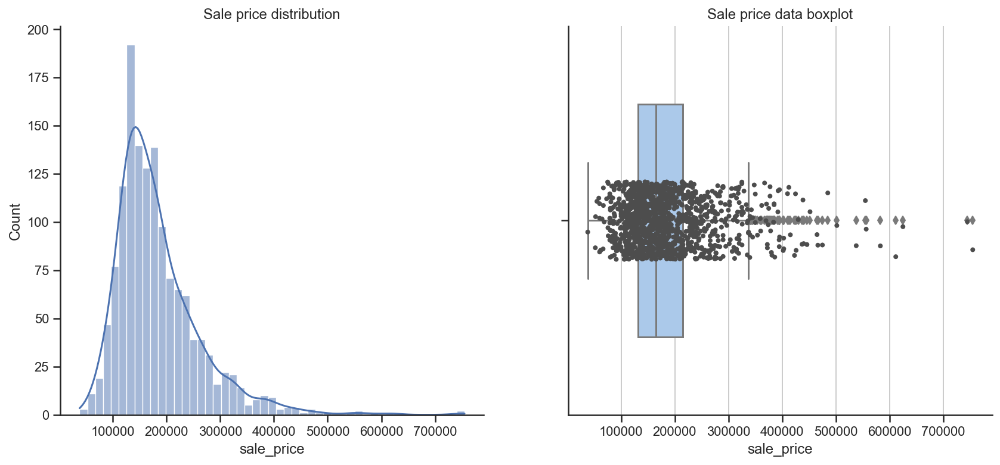

In [74]:
#histogram of sale price to look at the distribution within the data set

sns.set_theme(style="ticks")

# Initialize the figure with 
f, ax = plt.subplots(ncols=2, figsize=(14, 6))

sns.histplot(house['sale_price'], kde=True, palette="pastel",ax=ax[0]).set_title('Sale price distribution');
sns.boxplot(x="sale_price", data=house,width=.6, palette="pastel", ax = ax[1])

# Add in points to show each observation
sns.stripplot(x="sale_price",  data=house,size=4, color=".3", linewidth=0, ax = ax[1]).set_title('Sale price data boxplot')
ax[0].xaxis.grid(False)
ax[1].xaxis.grid(True)
sns.despine(trim=False, left=False)

#skewness and kurtosis
print("Skewness: %f" % house['sale_price'].skew())
print("Kurtosis: %f" % house['sale_price'].kurt())

In [75]:
from scipy.stats import norm

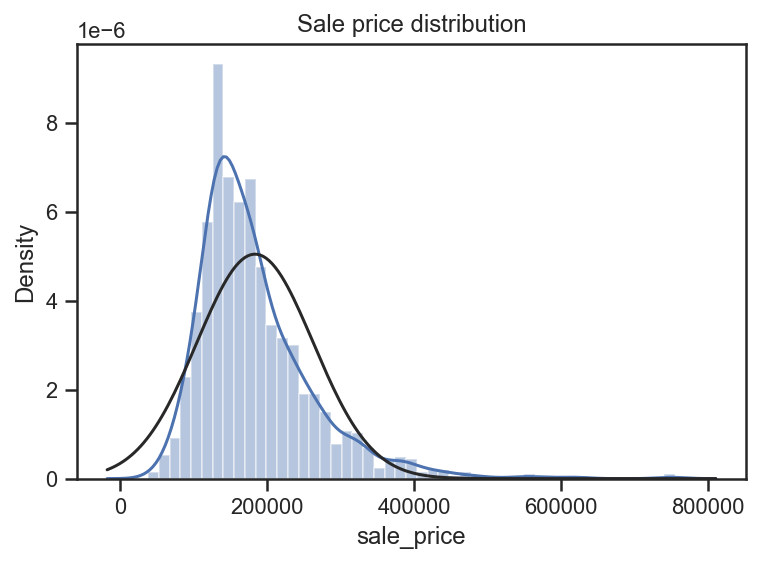

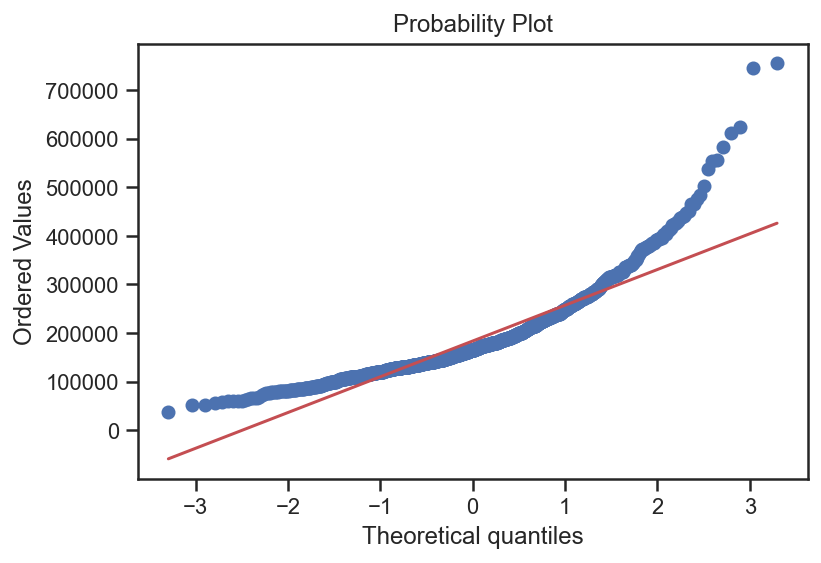

In [76]:
#histogram and normal probability plot
sns.distplot(house['sale_price'], fit=norm).set_title('Sale price distribution');
fig = plt.figure()
res = stats.probplot(house['sale_price'], plot=plt)


### Removing the outliers and looking at the sale price distribution again

In [77]:
def remove_outlier(df_in, col_name):
    q1 = df_in[col_name].quantile(0.25)
    q3 = df_in[col_name].quantile(0.75)
    iqr = q3-q1 #Interquartile range
    fence_low  = q1-1.5*iqr
    fence_high = q3+1.5*iqr
    df_out = df_in.loc[(df_in[col_name] > fence_low) & (df_in[col_name] < fence_high)]
    return df_out

In [78]:
house = remove_outlier(house, 'sale_price')
house.shape

(1346, 79)

Skewness: 0.693082
Kurtosis: 0.053071


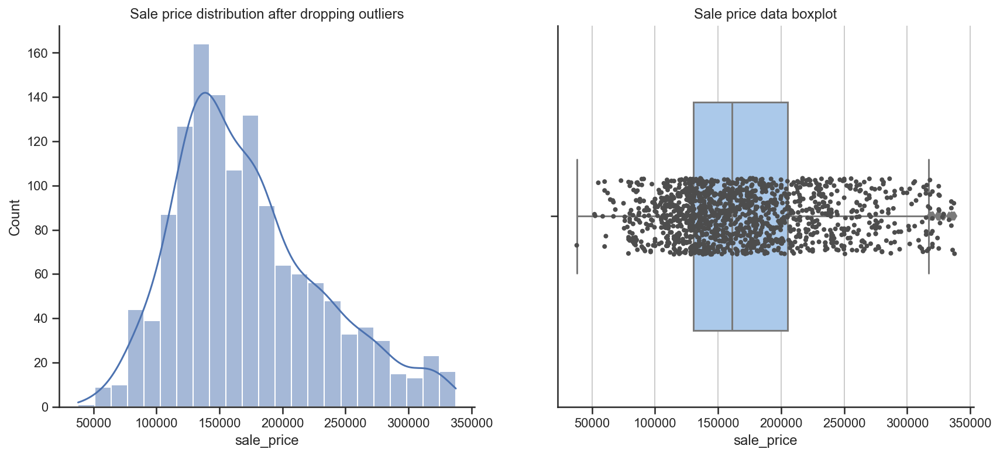

In [79]:
#histogram and box plot of sale price after dropping the outliers

sns.set_theme(style="ticks")

# Initialize the figure with 
f, ax = plt.subplots(ncols=2, figsize=(14, 6))

sns.histplot(house['sale_price'], kde=True, palette="pastel",ax=ax[0]).set_title('Sale price distribution after dropping outliers');
sns.boxplot(x="sale_price", data=house,width=.6, palette="pastel", ax = ax[1])

# Add in points to show each observation
sns.stripplot(x="sale_price",  data=house,size=4, color=".3", linewidth=0, ax = ax[1]).set_title('Sale price data boxplot')
ax[0].xaxis.grid(False)
ax[1].xaxis.grid(True)
sns.despine(trim=False, left=False)

#skewness and kurtosis
print("Skewness: %f" % house['sale_price'].skew())
print("Kurtosis: %f" % house['sale_price'].kurt())

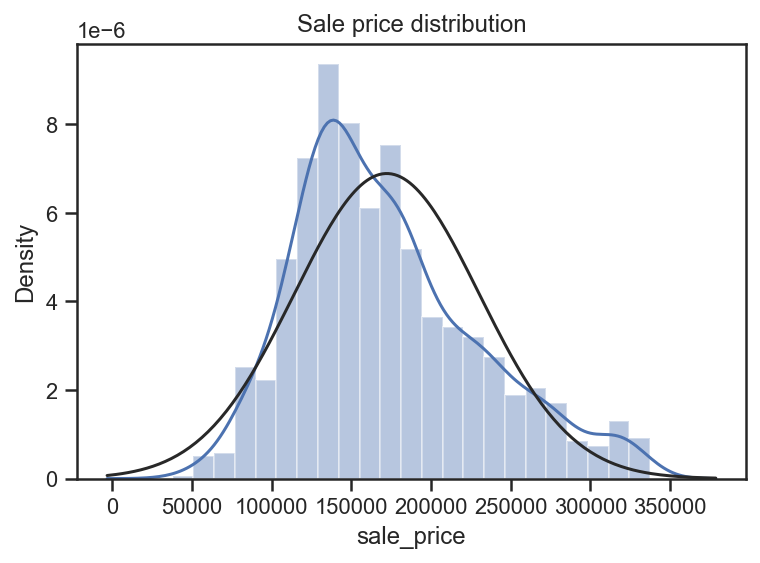

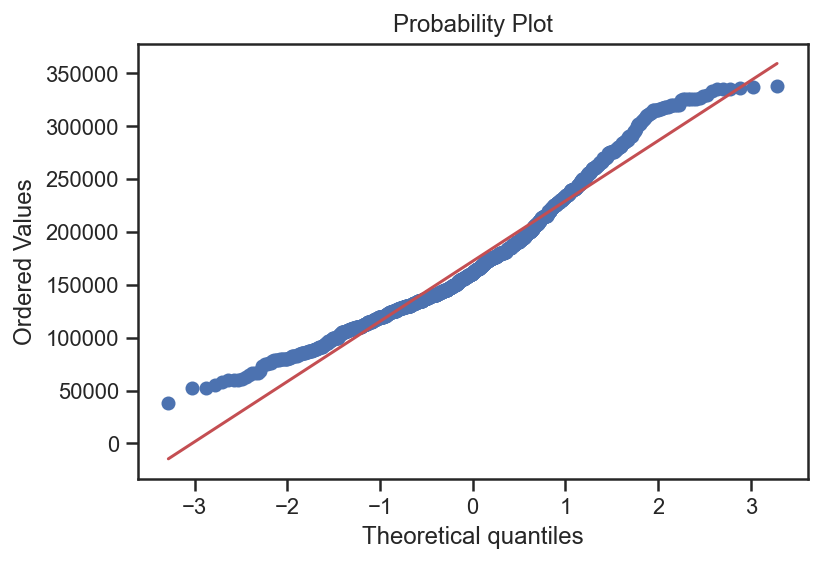

In [80]:
#histogram and normal probability plot
sns.distplot(house['sale_price'], fit=norm).set_title('Sale price distribution');
fig = plt.figure()
res = stats.probplot(house['sale_price'], plot=plt)


### Looking at the log of sale price distribution

In [81]:
# Lets see whenever logging sale price will help with normalising the distribution
house['sale_price_log'] = np.log(house['sale_price']).copy()

Skewness: -0.186844
Kurtosis: 0.121479


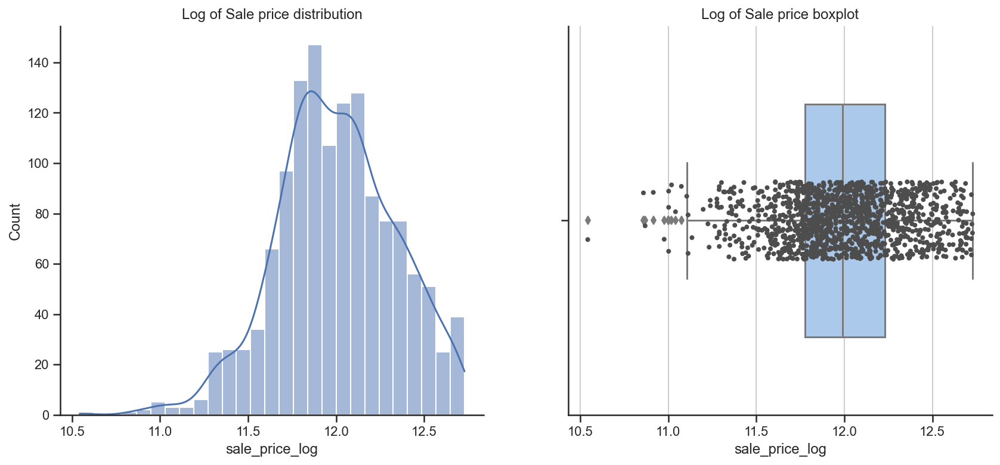

In [82]:
#histogram and box plot of sale price after logging sale price

sns.set_theme(style="ticks")

# Initialize the figure with 
f, ax = plt.subplots(ncols=2, figsize=(14, 6))

sns.histplot(house['sale_price_log'], kde=True, palette="pastel",ax=ax[0]).set_title('Log of Sale price distribution');
sns.boxplot(x="sale_price_log", data=house,width=.6, palette="pastel", ax = ax[1])

# Add in points to show each observation
sns.stripplot(x="sale_price_log",  data=house,size=4, color=".3", linewidth=0, ax = ax[1]).set_title('Log of Sale price boxplot')
ax[0].xaxis.grid(False)
ax[1].xaxis.grid(True)
sns.despine(trim=False, left=False)

#skewness and kurtosis
print("Skewness: %f" % house['sale_price_log'].skew())
print("Kurtosis: %f" % house['sale_price_log'].kurt())

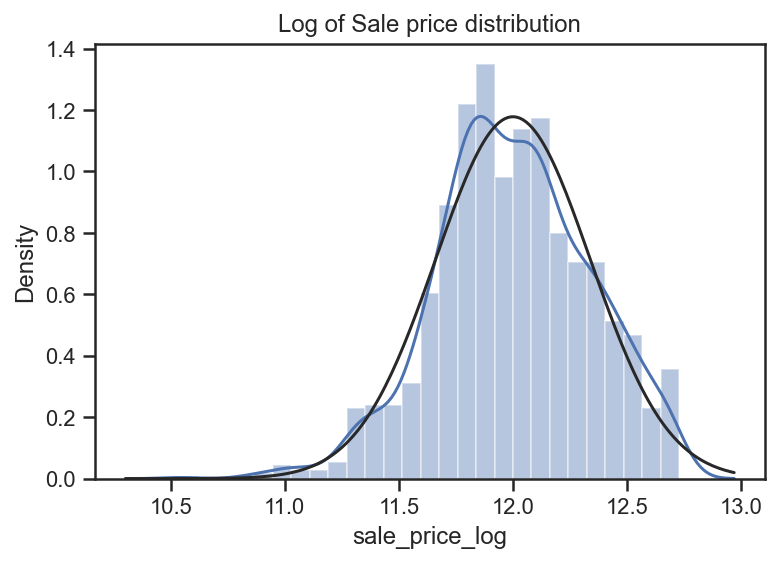

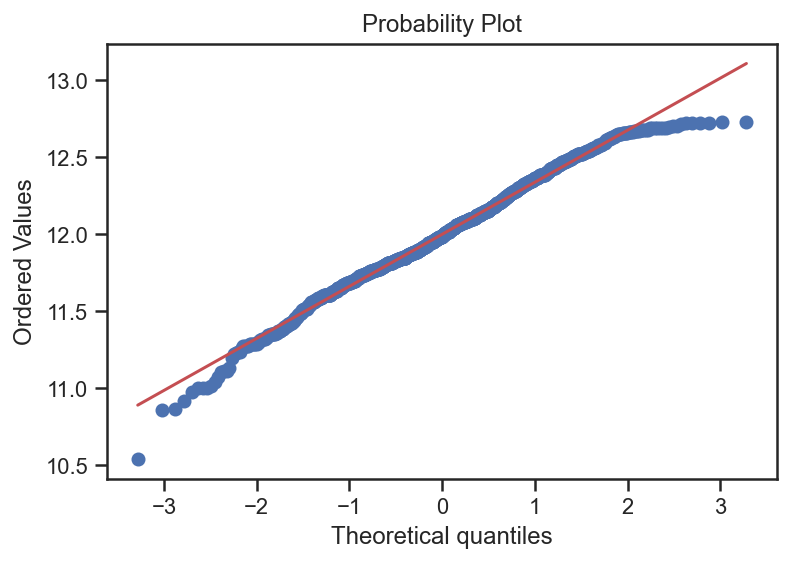

In [83]:
#histogram and normal probability plot
sns.distplot(house['sale_price_log'], fit=norm).set_title('Log of Sale price distribution');
fig = plt.figure()
res = stats.probplot(house['sale_price_log'], plot=plt)


## EDA 

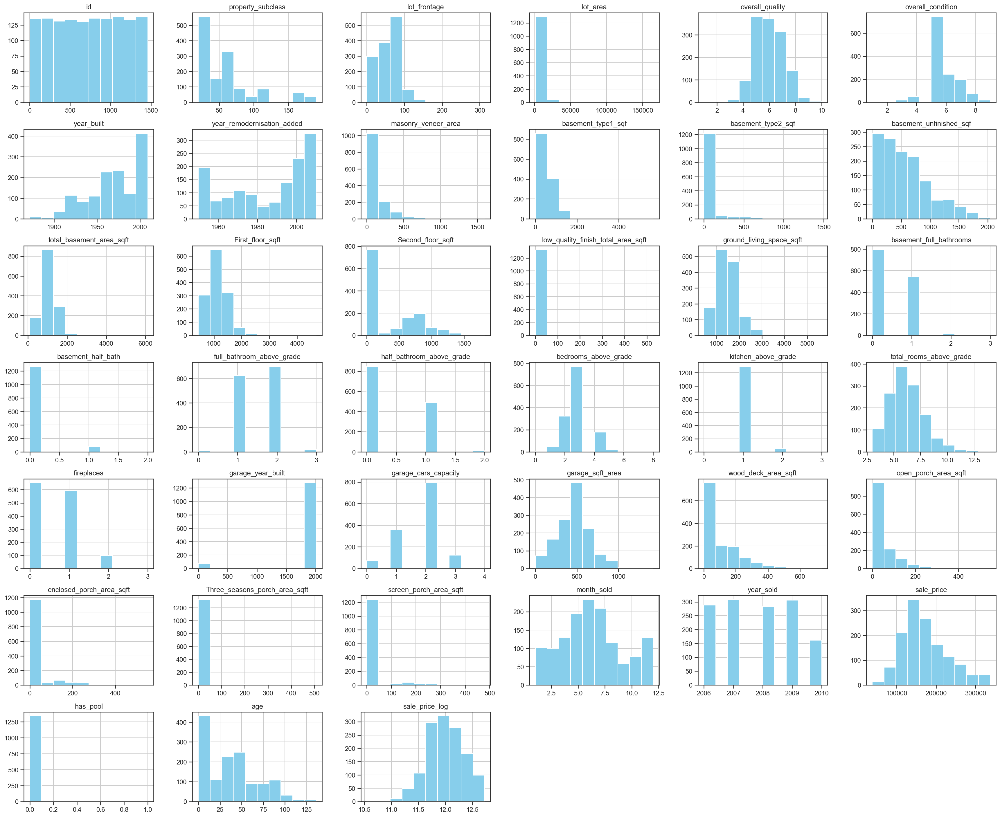

In [84]:
# looking at the data
house.hist(bins=10, figsize =(30,25), color = "skyblue")
plt.show()


In [85]:
#A function that plots a horizontal graph for the given column name

def horizontal_graph(data, column_name, color, plot_title):
    
    
    fig, ax = plt.subplots(figsize = (9, 6))
    
    title_cnt = data[column_name].value_counts().sort_values(ascending = False).reset_index()

    mn = ax.barh(title_cnt.iloc[:, 0], title_cnt.iloc[:, 1], edgecolor = 'black', color =
                sns.color_palette(color, len(title_cnt)))

    for s in ['top','bottom','left','right']:
        ax.spines[s].set_visible(False)

    # Remove x,y Ticks
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')

    # Add padding between axes and labels
    ax.xaxis.set_tick_params(pad=5)
    ax.yaxis.set_tick_params(pad=10)

    # Add x,y gridlines
    ax.grid(b=True, color='grey', linestyle='-.', linewidth=1, alpha=0.2)

    # Show top values 
    ax.invert_yaxis()

    ax.set_title(plot_title,weight='bold',loc='center', pad=10, fontsize=16)
    
    ax.set_xlabel('Count', weight='bold')

    for i in ax.patches:
        ax.text(i.get_width() + 1.0, i.get_y() + 0.5, str(round((i.get_width()), 2)),
                fontsize=10, fontweight='bold', color='grey')

    plt.yticks(weight='bold')
    plt.xticks(weight='bold')

    plt.show()

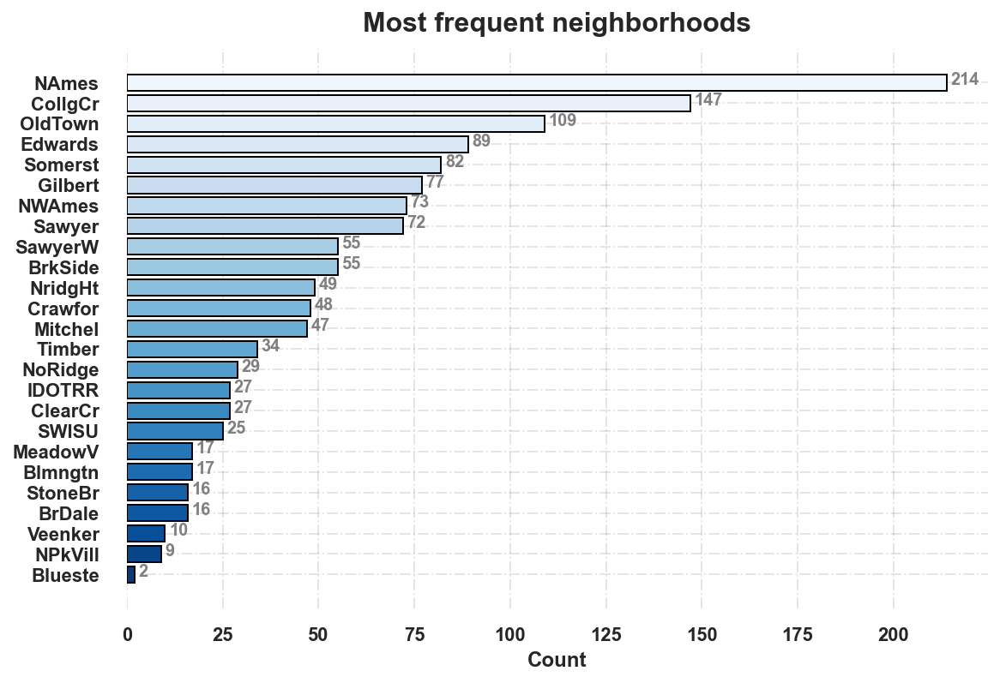

In [86]:
horizontal_graph(house, 'neighbourhood', 'Blues', 'Most frequent neighborhoods')

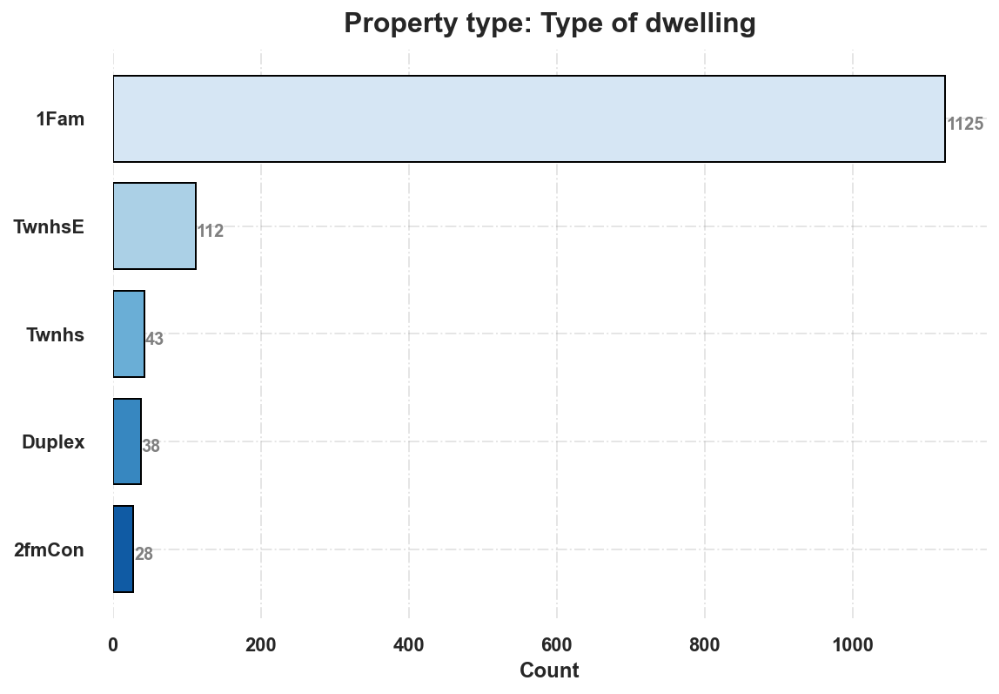

In [87]:
horizontal_graph(house, 'property_type', 'Blues', 'Property type: Type of dwelling')


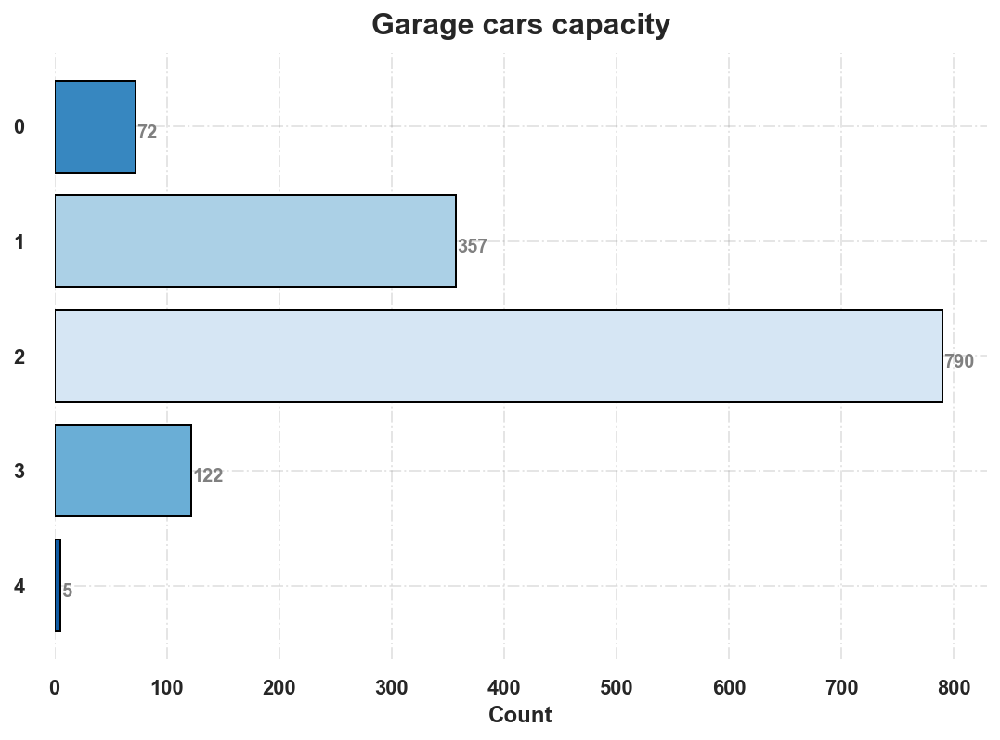

In [88]:
horizontal_graph(house, 'garage_cars_capacity', 'Blues', 'Garage cars capacity')

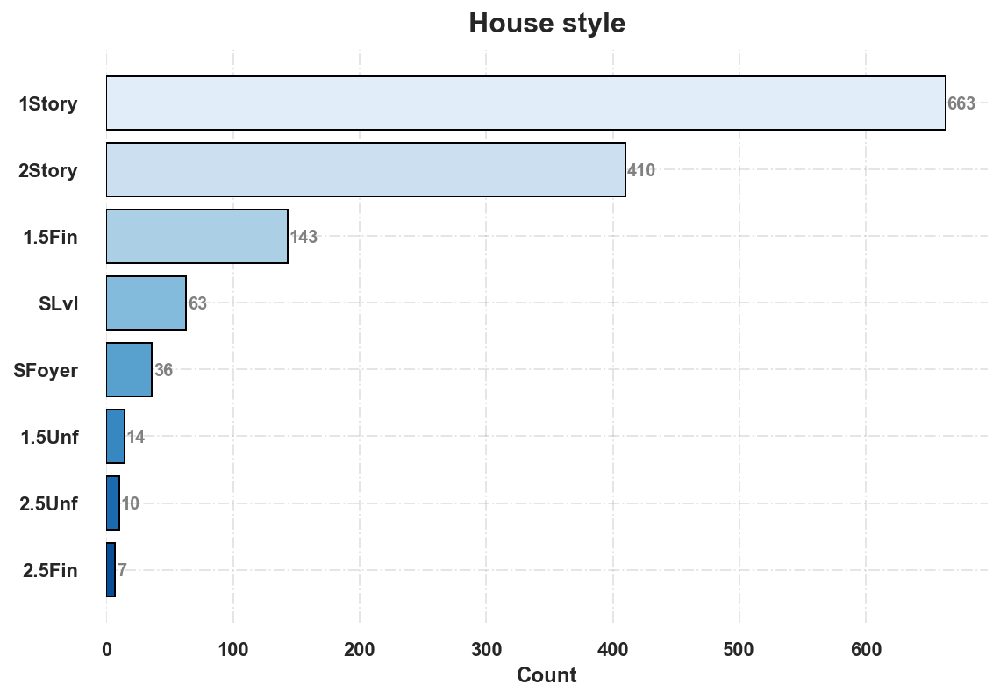

In [89]:
horizontal_graph(house, 'house_style', 'Blues', 'House style')

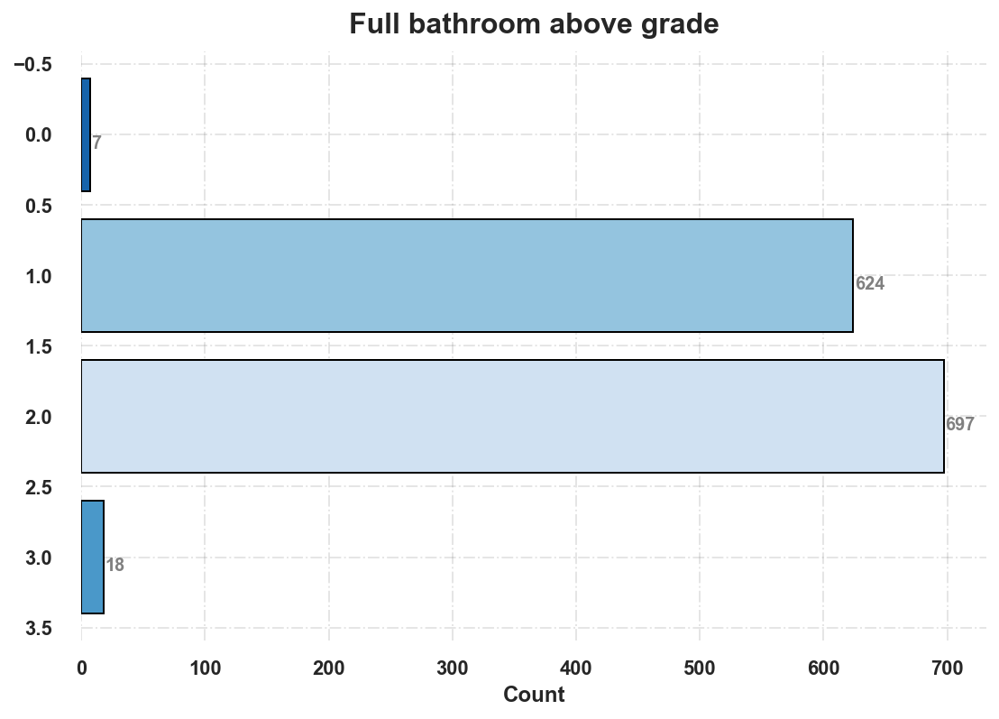

In [90]:
horizontal_graph(house, 'full_bathroom_above_grade', 'Blues', 'Full bathroom above grade')

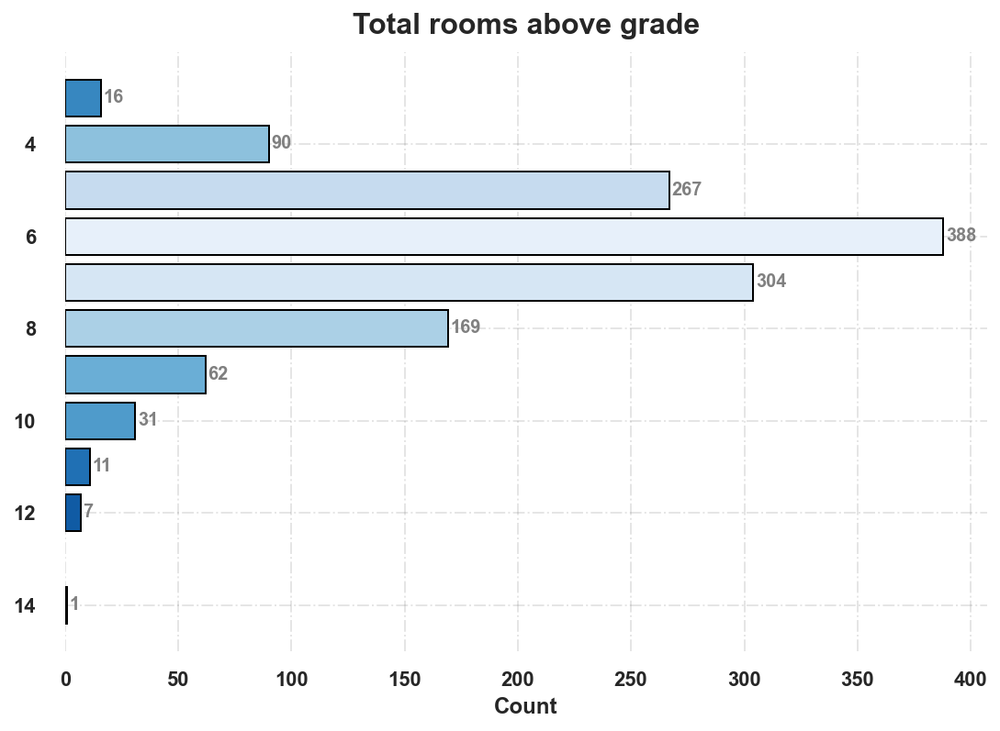

In [91]:
horizontal_graph(house, 'total_rooms_above_grade', 'Blues', 'Total rooms above grade')

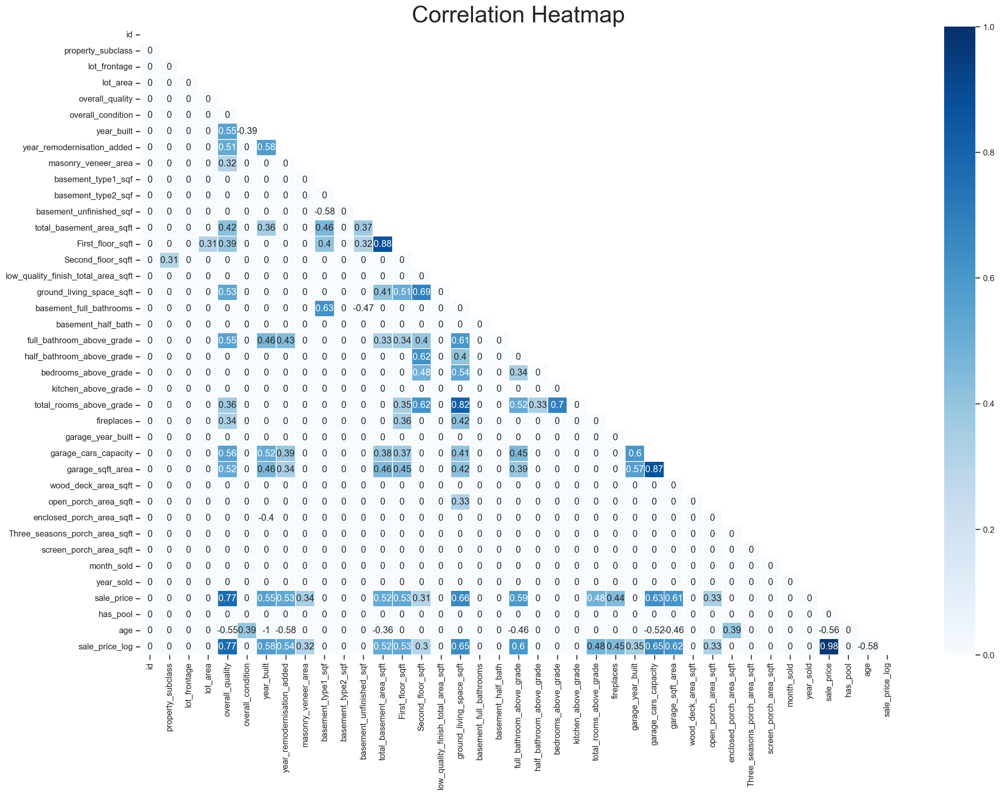

In [92]:
# plot correlation heatmap
plt.figure(figsize = (22,15))

corr_matrix = house.corr()
mask =  np.triu(np.ones_like(corr_matrix, dtype=bool))
corr_matrix[(corr_matrix < 0.3) & (corr_matrix > -0.3)] = 0
sns.heatmap(corr_matrix, annot=True, mask=mask, linewidths=0.5,cmap='Blues', vmin=0, vmax=1)
plt.title('Correlation Heatmap', fontdict = {'fontsize' : 30});

In [93]:
# Define Numeric and Categorical columns.
numerical_cols = []
categorical_cols = []

for col in house.columns:
    if house[col].dtype in('int64','float64'):
        numerical_cols.append(house[col].name)
    else:
        categorical_cols.append(house[col].name)


### Scatterplots of the continuous data

In [118]:
def scatterplot(numerical_cols, y, df):
    for i in range(len(numerical_cols)):
        plt.figure(figsize=(10,8))
        plt.xticks(rotation=90)
        sns.scatterplot(x = df[numerical_cols[i]], y=y, data=df)
        plt.title(f'Scatterplot of {numerical_cols[i]} vs sale price', fontsize=16)
        plt.show()
        print()
        print()

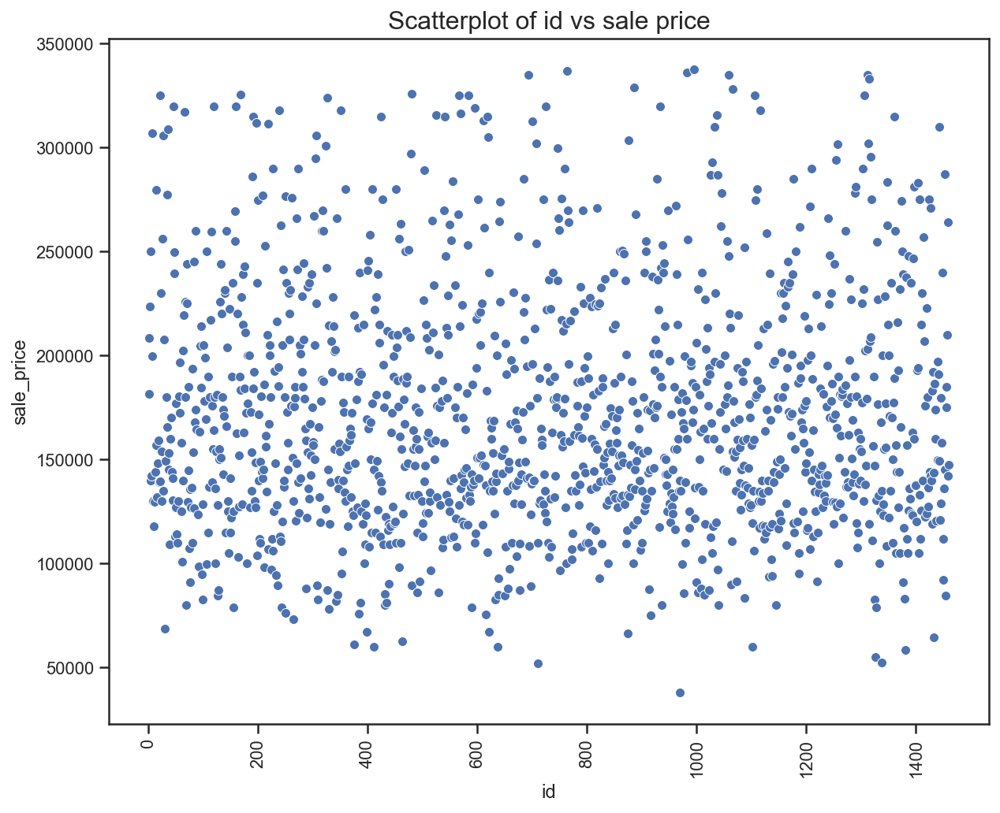

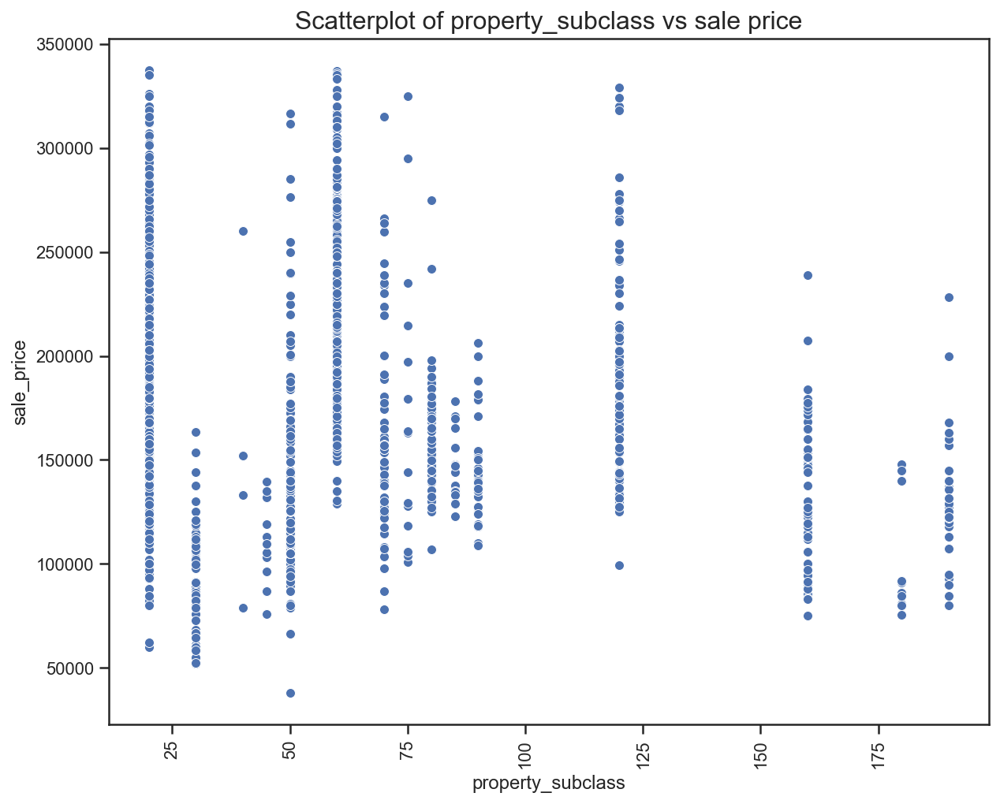

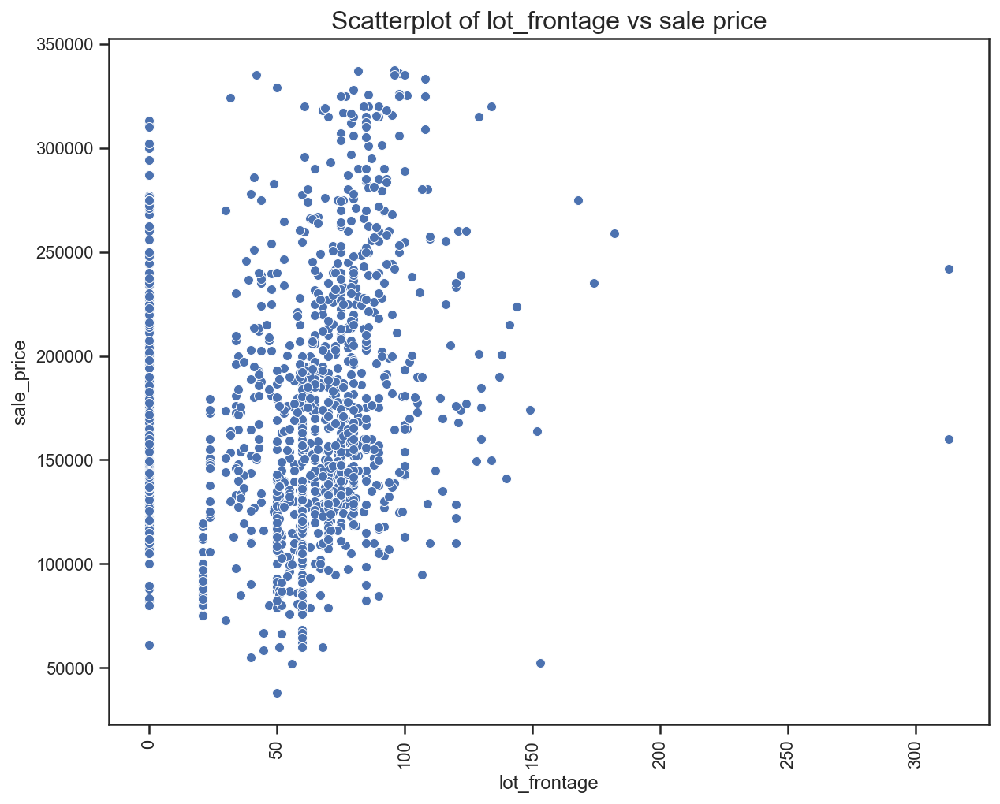

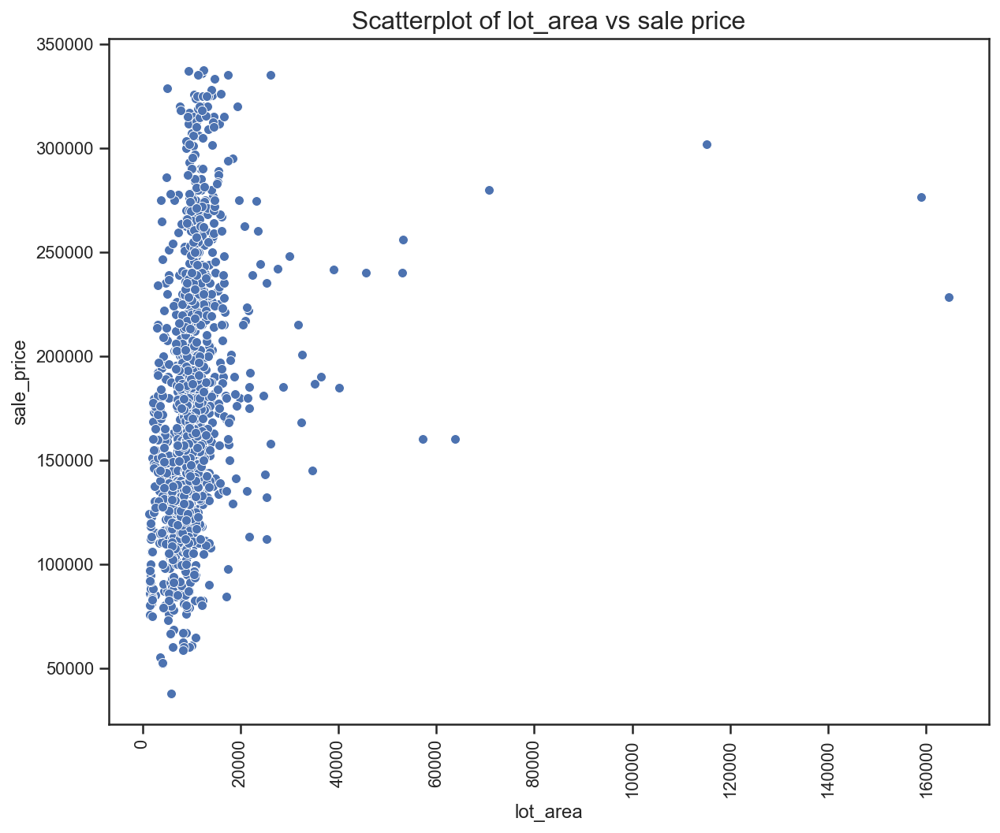

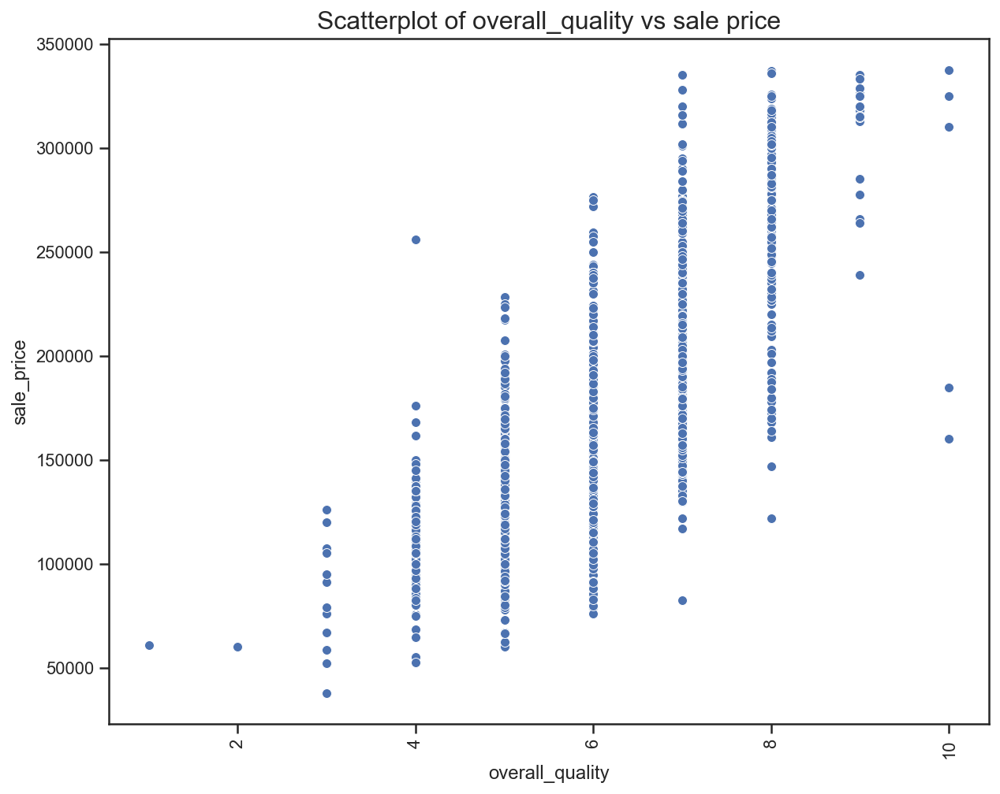

...

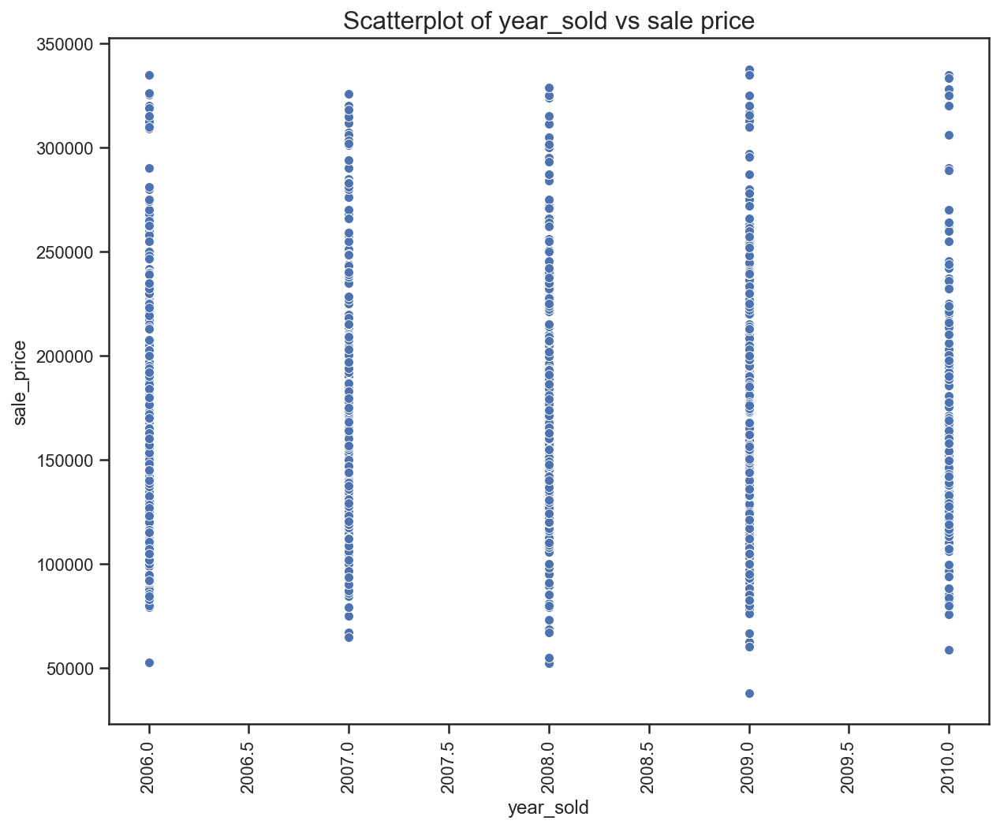

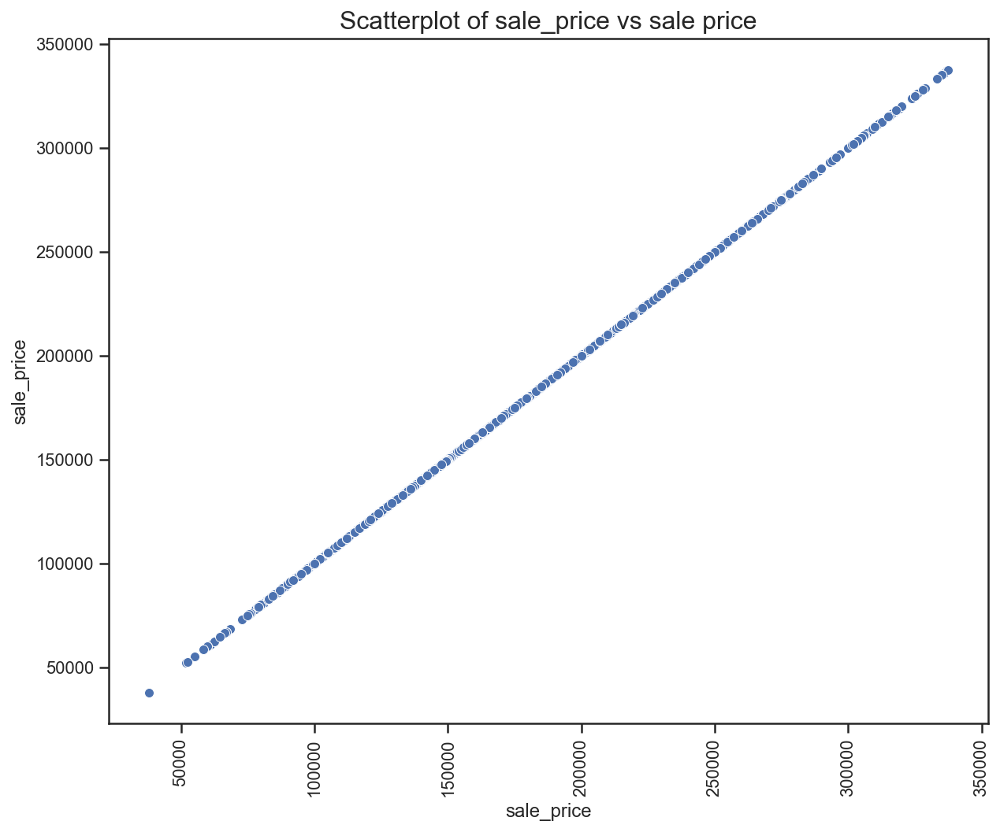

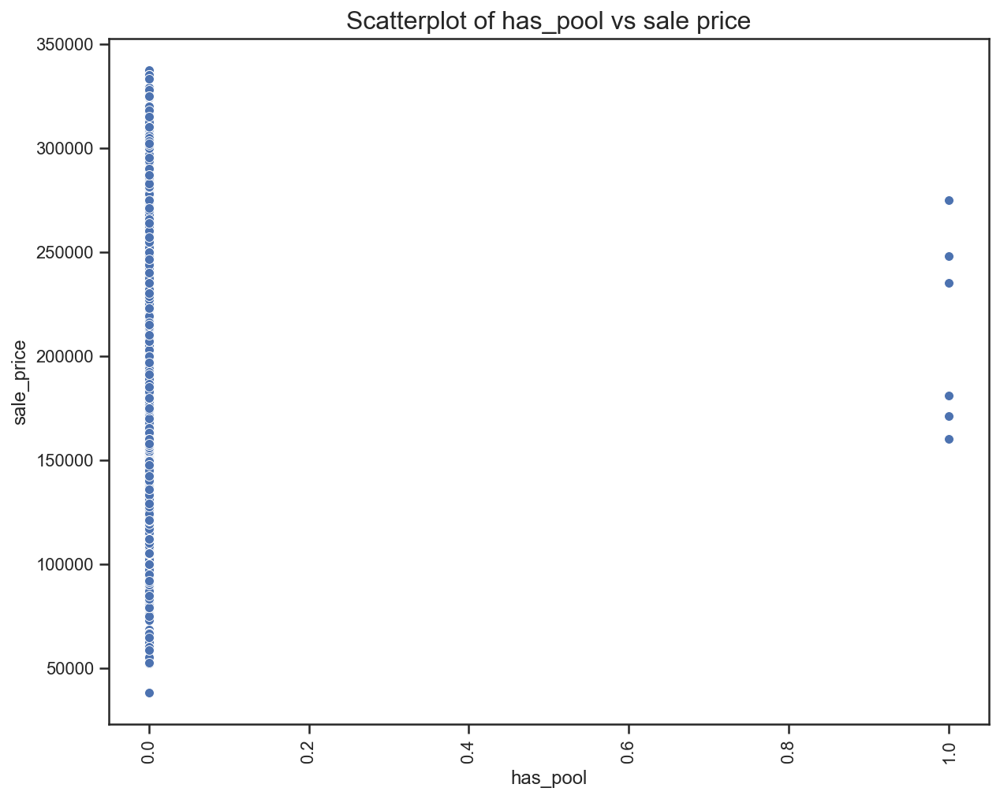

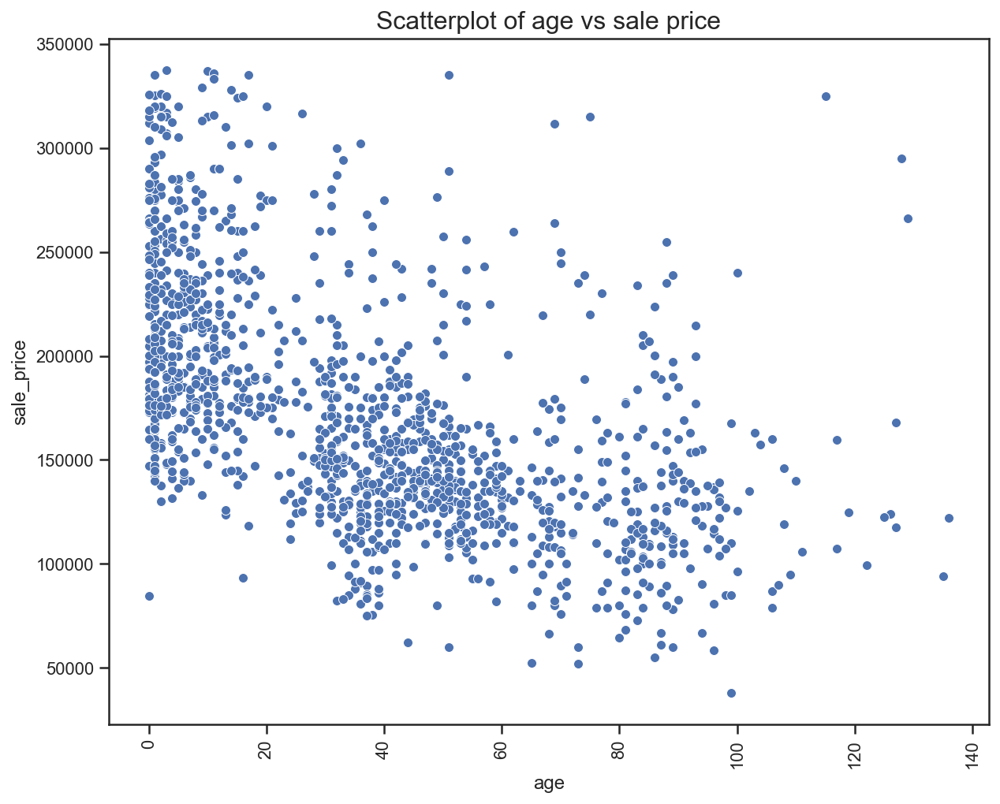

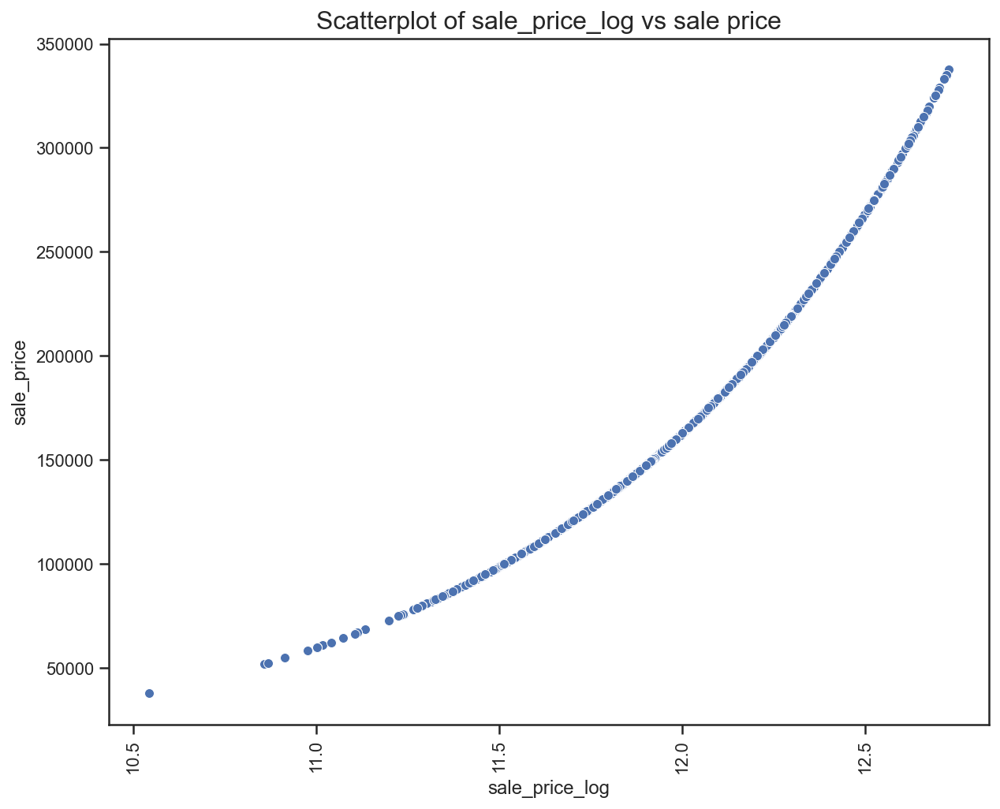

In [120]:
scatterplot(numerical_cols, house['sale_price'], house)

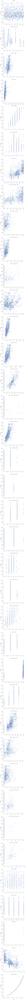

In [100]:
def scatterplot(x, y, **kwargs):
    sns.scatterplot(x=x, y=y)
    x=plt.xticks(rotation=90)
f = pd.melt(house, id_vars=['sale_price'], value_vars=numerical_cols)
g = sns.FacetGrid(f, col="variable",  col_wrap=1, sharex=False, sharey=False, size=8)
g = g.map(scatterplot, "value", "sale_price")

Looking at the scatterplots the following columns looks more like categorical variables therefore I'll change the dtype to object...
overall_quality
overall_condition
has_pool

In [ ]:
house = house.astype({'overall_quality': 'object', 'overall_condition': 'object', 'has_pool': 'object'})

In [ ]:
house.info()

In [ ]:
additional_categorical_cols = ['overall_quality', 'overall_condition', 'has_pool']
categorical_cols.extend(additional_categorical_cols)
categorical_cols

### Boxplots of the categorical data

In [ ]:
def boxplot(x, y, **kwargs):
    sns.boxplot(x=x, y=y)
    x=plt.xticks(rotation=90)
f = pd.melt(house, id_vars=['sale_price'], value_vars=categorical_cols)
g = sns.FacetGrid(f, col="variable",  col_wrap=1, sharex=False, sharey=False, size=8)
g = g.map(boxplot, "value", "sale_price")

In [ ]:
var = 'year_built'
data = pd.concat([house['sale_price'], house[var]], axis=1)
f, ax = plt.subplots(figsize=(18, 8))
fig = sns.boxplot(x=var, y="sale_price", data=data)
fig.axis(ymin=0, ymax=800000);
plt.xticks(rotation=90);

## Separating features into fixed and renovateable groups

In [ ]:
# Creating a list and df of the 'renovate-able' characteristics

cols_renovate = ['overall_quality','overall_condition', 'roof_style','roof_matl','exterior_material_1',
                        'exterior_material_2','external_material_quality','external_material_condition',
          'heating','heating_quality','air_conditioning','electrical','kitchen_quality','home_funcionality',
           'utilities', 'fireplaces', 'garage_interior_finish','garage_quality', 'garage_condition', 'fence', 'masonry_veneer_type' ]
house_renovate = house[cols_renovate].copy()

In [ ]:
# Creating a list and df of the 'Fixed' characteristics
cols_fixed = ['property_subclass','property_zoning','lot_area','street','lot_shape', 'land_contour','lot_frontage',
        'lot_config','land_slope','neighbourhood', 'condition_1', 'condition_2', 'property_type',
       'house_style','year_remodernisation_added', 'fireplaces', 'age', 'paved_driveway',
        'foundation','basement_type1_sqf','basement_type2_sqf','basement_unfinished_sqf','total_basement_area_sqft',
        'First_floor_sqft','Second_floor_sqft','low_quality_finish_total_area_sqft','ground_living_space_sqft',
        'basement_full_bathrooms','basement_half_bath','full_bathroom_above_grade','half_bathroom_above_grade',
        'bedrooms_above_grade','kitchen_above_grade','total_rooms_above_grade','garage_cars_capacity',
        'garage_sqft_area','wood_deck_area_sqft','open_porch_area_sqft','enclosed_porch_area_sqft',
          'Three_seasons_porch_area_sqft','screen_porch_area_sqft','has_pool', 'masonry_veneer_area', 'sale_type', 'sale_condition'
       ]
house_fixed = house[cols_fixed].copy()

In [ ]:
house_renovate['sale_price'] = house.sale_price
house_fixed['sale_price'] = house.sale_price

In [ ]:
# plot correlation heatmap
plt.figure(figsize = (22,15))

corr_matrix = house_renovate.corr()
mask =  np.triu(np.ones_like(corr_matrix, dtype=bool))
#corr_matrix[(corr_matrix < 0.3) & (corr_matrix > -0.3)] = 0
sns.heatmap(corr_matrix, annot=True, mask=mask, linewidths=0.5,cmap='Blues', vmin=0, vmax=1)
plt.title('Correlation Heatmap - renovate features', fontdict = {'fontsize' : 30});

In [ ]:
# plot correlation heatmap
plt.figure(figsize = (23,16))

corr_matrix = house_fixed.corr().round(2)
mask =  np.triu(np.ones_like(corr_matrix, dtype=bool))
#corr_matrix[(corr_matrix < 0.3) & (corr_matrix > -0.3)] = 0
sns.heatmap(corr_matrix, annot=True, mask=mask, linewidths=0.5,cmap="Blues", vmin=0, vmax=1)
plt.title('Correlation Heatmap - fixed features', fontdict = {'fontsize' : 30});

In [ ]:
k= 11
cols = house_fixed.corr().nlargest(k, 'sale_price')['sale_price'].index
cols

In [ ]:
#looking at 11 highest correlation between sale price and fixed variables
k = 11 #number of variables for heatmap
cols = house_fixed.corr().nlargest(k, 'sale_price')['sale_price'].index
cm = np.corrcoef(house_fixed[cols].values.T)
sns.set(font_scale=1.25)
hm = sns.heatmap(cm , cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values,cmap="PiYG")
plt.show()

### Saving clean data into csv for the modeling 

In [ ]:
#house.to_csv('house.csv', index=False)